# Analysis Comparing Clusters

## Imports + Dataset Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import collections
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, silhouette_score, v_measure_score, silhouette_samples, jaccard_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
import statsmodels.api as sm
import math
import umap.plot
import umap.umap_ as umap_
from kneed import KneeLocator
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
import json

### Data Setup

In [2]:
DATA_DIR_PATH = '/Users/cindywang/PycharmProjects/bpd-subtyping/data/'
CDATA_DIR_PATH = DATA_DIR_PATH + 'processed/clusters/'
VDATA_DIR_PATH = DATA_DIR_PATH + 'processed/vector/'
RDATA_DIR_PATH = DATA_DIR_PATH + 'processed/risk/'

In [3]:
# importing in important datasets
ds_df = pd.read_csv(DATA_DIR_PATH + 'daily_support.csv')  # daily support dataframe
dw_df = pd.read_csv(DATA_DIR_PATH + 'daily_weight.csv')
# dm_df = pd.read_csv(DATA_DIR_PATH + 'daily_medications.csv')  # daily medications dataframe
# dp_df = pd.read_csv(DATA_DIR_PATH + 'daily_procedures.csv')  # daily procedures dataframe
pf_df = pd.read_csv(DATA_DIR_PATH + 'patient_facts.csv')  # patient facts dataframe

In [4]:
mf_df = pd.read_csv(DATA_DIR_PATH + 'maternal_facts.csv')  # patient facts dataframe
dis_df = pd.read_csv(DATA_DIR_PATH + 'discharge_bpd_status.csv')  # bpd grade df
dis_df['BPD Grade'] = dis_df['BPD Grade'].replace(-1, 4)  # to adjust premature death to be 4 instead of -1
tar_df = pd.read_csv(DATA_DIR_PATH + 'processed/full/tar_df.csv')  # full risk df

In [5]:
pm_df = pd.read_csv(DATA_DIR_PATH + 'patient_manifest.csv')

In [6]:
pm_df.merge(dis_df)['BPD Grade'].value_counts()

0    37832
1    10670
2     6340
4     6095
3      968
Name: BPD Grade, dtype: int64

In [9]:
# for entry into sheet
columns = ['umap_KMeans_' + str(i) for i in range(2, 7)]
for cluster in clusters:
    print(cluster)
    curr_c_df = pd.read_csv(CDATA_DIR_PATH + cluster + c_suffix)
    for col in columns:
        print(col)
        print(curr_c_df[col].value_counts())

do_d1g3_t
umap_KMeans_2
0    1246
1     890
Name: umap_KMeans_2, dtype: int64
umap_KMeans_3
1    1312
0     757
2      67
Name: umap_KMeans_3, dtype: int64
umap_KMeans_4
0    762
3    712
1    595
2     67
Name: umap_KMeans_4, dtype: int64
umap_KMeans_5
1    653
4    541
3    480
0    395
2     67
Name: umap_KMeans_5, dtype: int64
umap_KMeans_6
1    636
3    467
4    383
0    371
5    212
2     67
Name: umap_KMeans_6, dtype: int64
do_d3g3_t
umap_KMeans_2
1    1200
0     881
Name: umap_KMeans_2, dtype: int64
umap_KMeans_3
0    782
1    704
2    595
Name: umap_KMeans_3, dtype: int64
umap_KMeans_4
1    698
3    645
0    521
2    217
Name: umap_KMeans_4, dtype: int64
umap_KMeans_5
3    530
1    521
4    420
0    386
2    224
Name: umap_KMeans_5, dtype: int64
umap_KMeans_6
3    413
0    405
2    384
5    358
1    300
4    221
Name: umap_KMeans_6, dtype: int64
do_d7g3_t
umap_KMeans_2
0    1261
1     787
Name: umap_KMeans_2, dtype: int64
umap_KMeans_3
2    772
0    720
1    556
Name: umap_KMe

### Visualization Setup

In [7]:
pal = sns.color_palette('colorblind')
colors = pal.as_hex()
print(colors)
new_pal = ['#0173b2', '#de8f05', '#029e73', '#ece133']
colors

['#0173b2', '#de8f05', '#029e73', '#d55e00', '#cc78bc', '#ca9161', '#fbafe4', '#949494', '#ece133', '#56b4e9']


['#0173b2',
 '#de8f05',
 '#029e73',
 '#d55e00',
 '#cc78bc',
 '#ca9161',
 '#fbafe4',
 '#949494',
 '#ece133',
 '#56b4e9']

In [10]:
clusters = ['do_d1g3_t', 'do_d3g3_t', 'do_d7g3_t', 'do_d14g3_t', 'do_d21g3_t', 'do_d27g3_t']
cluster_cols = ['umap_KMeans_4', 'umap_KMeans_3', 'umap_KMeans_4', 'umap_KMeans_4', 'umap_KMeans_2', 'umap_KMeans_4']
labels = ['A', 'B', 'C', 'D', 'E', 'F']
days = [1, 3, 7, 14, 21, 27]
grades = [3]
categories = [f"Day {day} Grade {grade}" for day in days for grade in grades]
days_mapping = dict(zip(clusters, categories))
c_suffix = 'c_df.csv'
mr_suffix = 'mr_df.csv'

### Visualizations

#### General Distribution Plots

do_d1g3_t


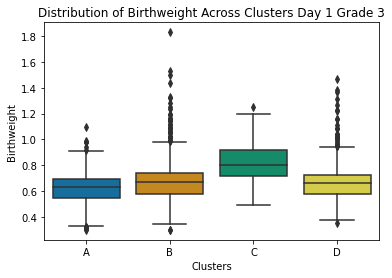

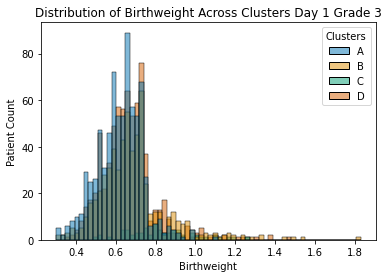

             Mean        SD
Cluster                    
A        0.620615  0.112904
B        0.684993  0.173047
C        0.826045  0.164648
D        0.664721  0.137027


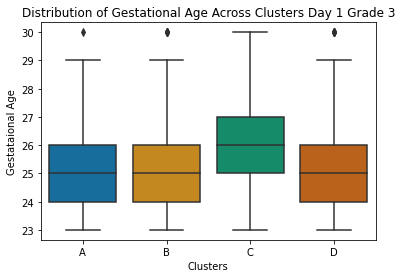

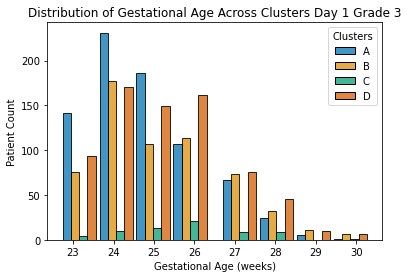

              Mean        SD
Cluster                     
A        24.770341  1.380743
B        25.168067  1.580177
C        25.791045  1.492784
D        25.231742  1.552079


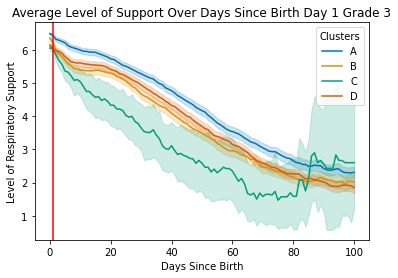

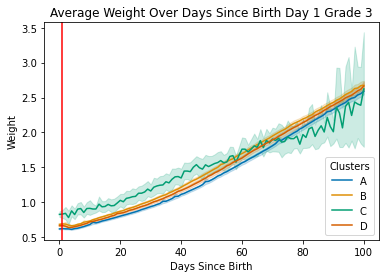

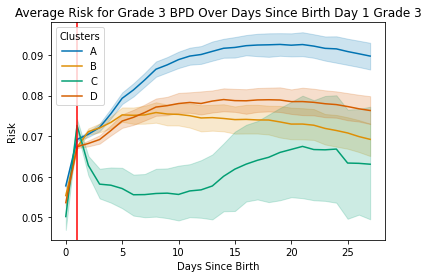

Average Risk Across Clusters
Cluster A: 0.06917993745695536
Cluster B: 0.06729917011092436
Cluster C: 0.07265188111194029
Cluster D: 0.06740210840042132


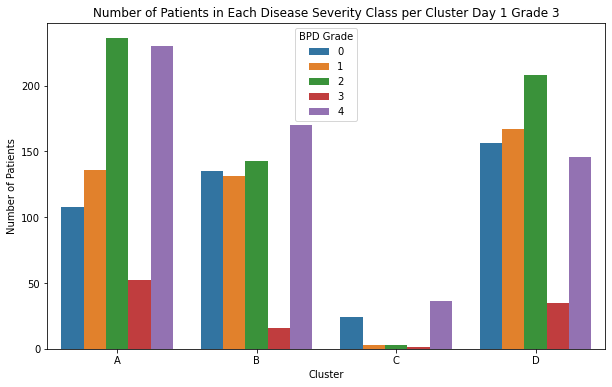

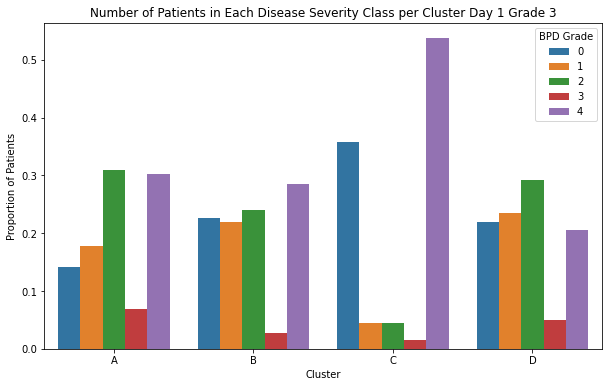

do_d3g3_t


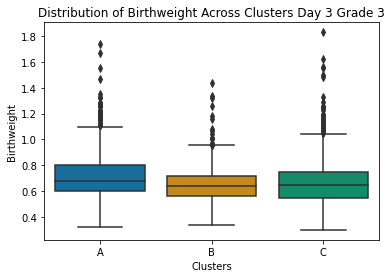

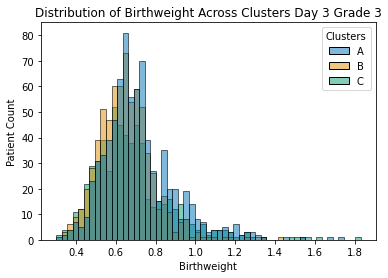

             Mean        SD
Cluster                    
A        0.715286  0.183065
B        0.647320  0.137823
C        0.682052  0.201644


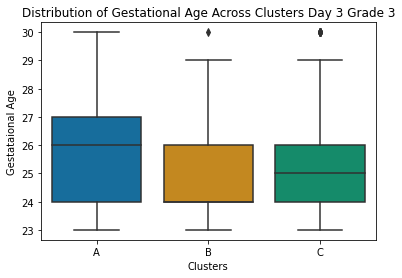

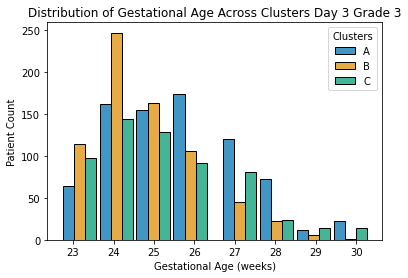

              Mean        SD
Cluster                     
A        25.643223  1.664366
B        24.738636  1.338727
C        25.188235  1.702107


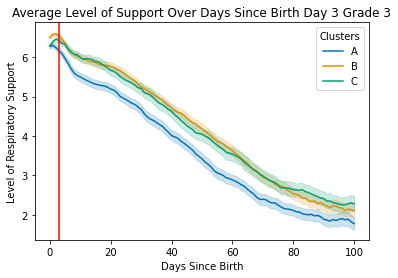

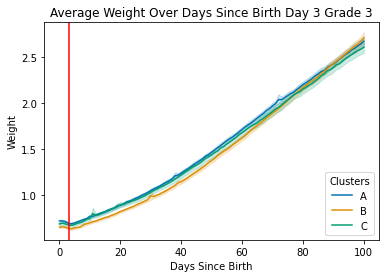

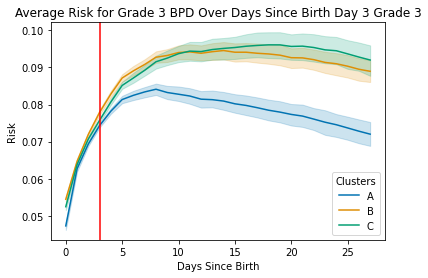

Average Risk Across Clusters
Cluster A: 0.07434330853439897
Cluster B: 0.07789209721235794
Cluster C: 0.07574696404588234


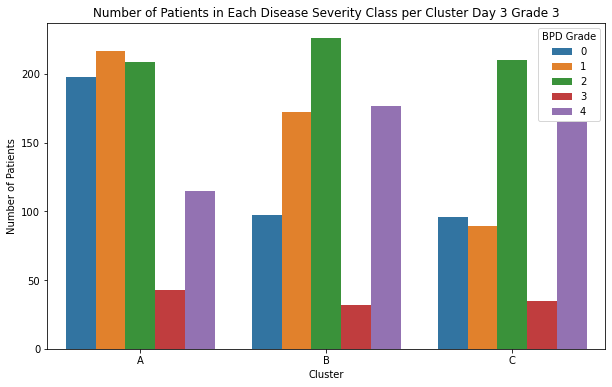

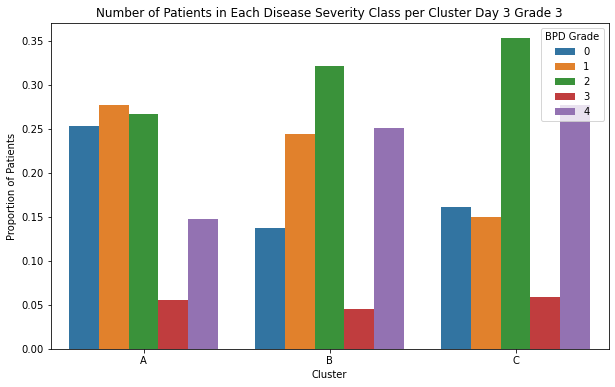

do_d7g3_t


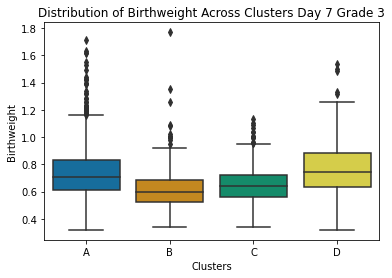

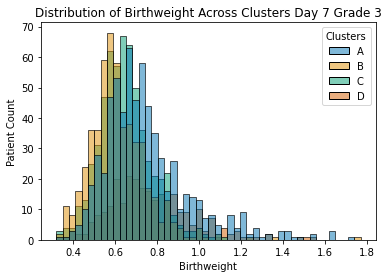

             Mean        SD
Cluster                    
A        0.747366  0.210150
B        0.613159  0.144064
C        0.648475  0.128083
D        0.771541  0.201961


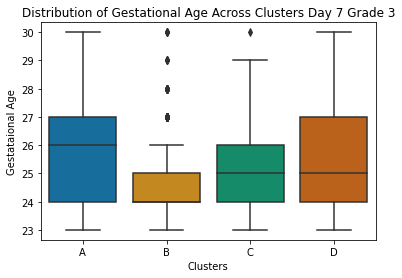

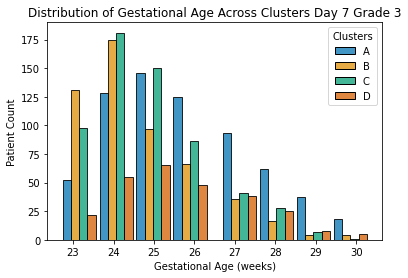

              Mean        SD
Cluster                     
A        25.760968  1.762502
B        24.593573  1.462678
C        24.844595  1.423576
D        25.590226  1.657840


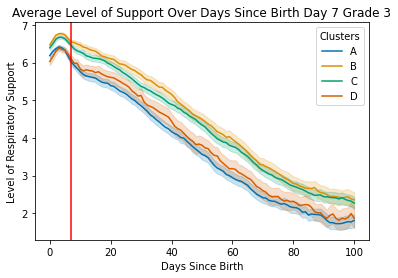

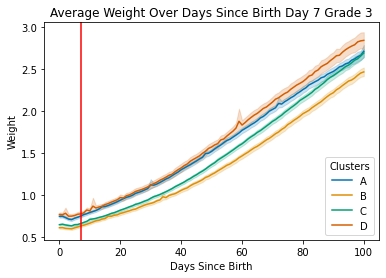

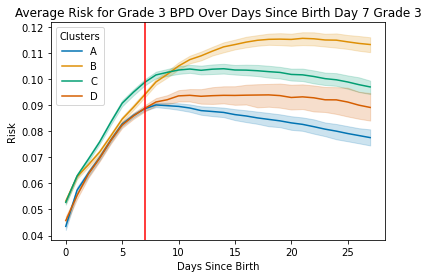

Average Risk Across Clusters
Cluster A: 0.0885603127375189
Cluster B: 0.09392175662627598
Cluster C: 0.09866831328547296
Cluster D: 0.0887080152842105


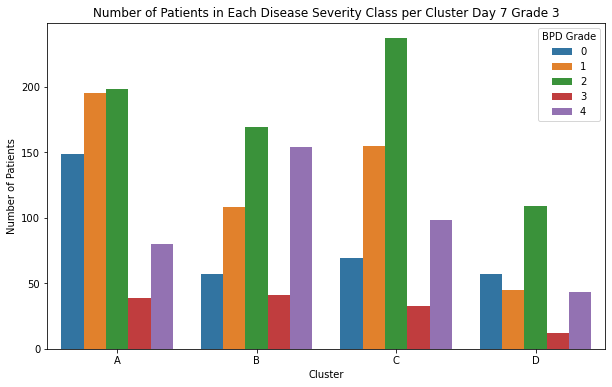

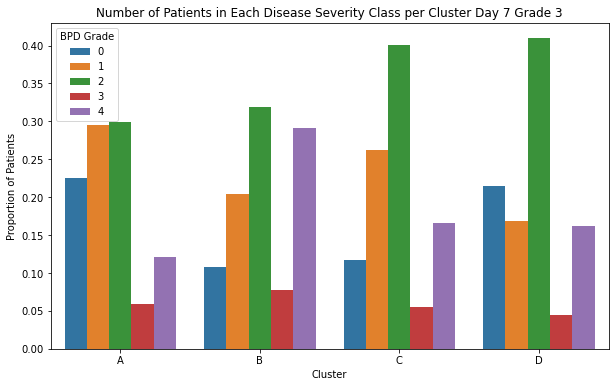

do_d14g3_t


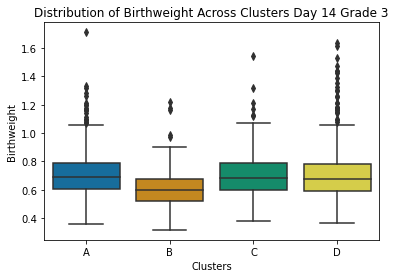

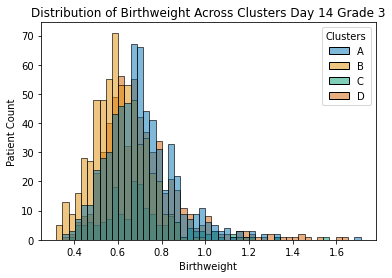

             Mean        SD
Cluster                    
A        0.705528  0.160009
B        0.604486  0.122408
C        0.706840  0.181790
D        0.707536  0.183977


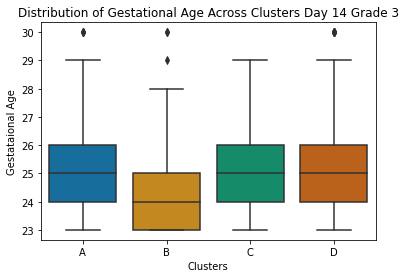

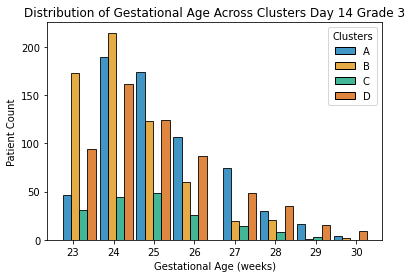

              Mean        SD
Cluster                     
A        25.232087  1.463236
B        24.375610  1.315303
C        24.908571  1.455345
D        25.078261  1.668252


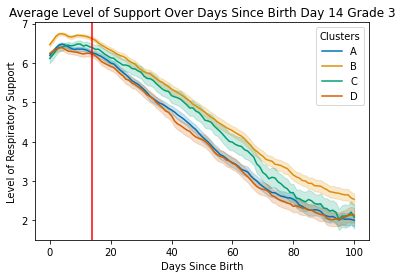

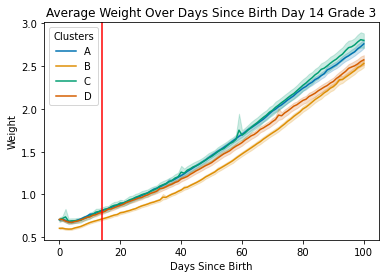

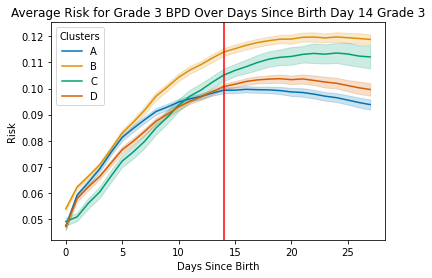

Average Risk Across Clusters
Cluster A: 0.09934363799283488
Cluster B: 0.1139948836726829
Cluster C: 0.10513460793771427
Cluster D: 0.10075741526086955


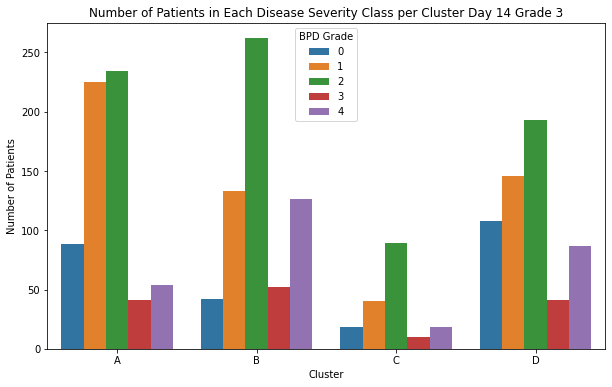

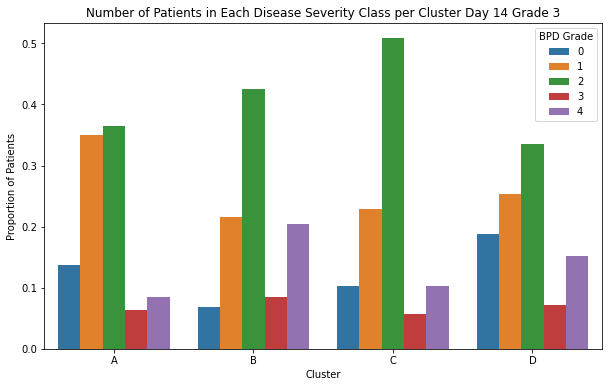

do_d21g3_t


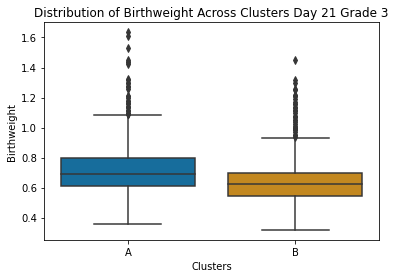

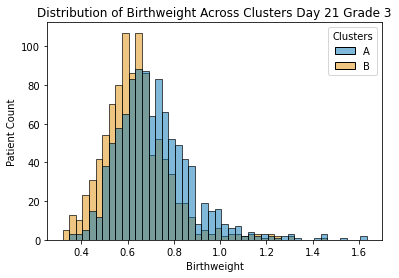

             Mean        SD
Cluster                    
A        0.714214  0.165738
B        0.636340  0.146518


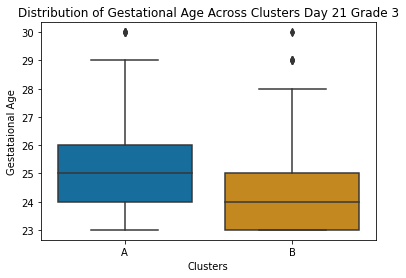

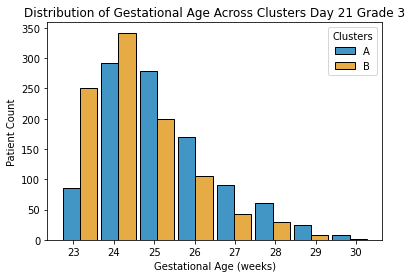

              Mean        SD
Cluster                     
A        25.201589  1.493551
B        24.462168  1.347920


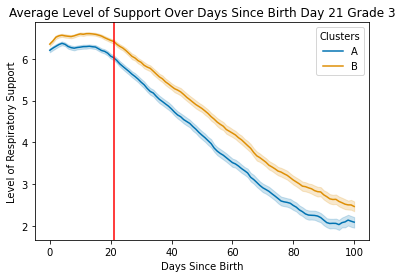

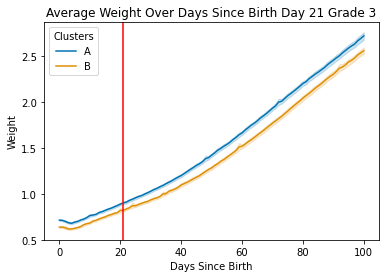

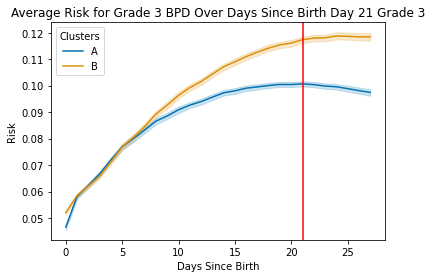

Average Risk Across Clusters
Cluster A: 0.10066686309473684
Cluster B: 0.11734491941083844


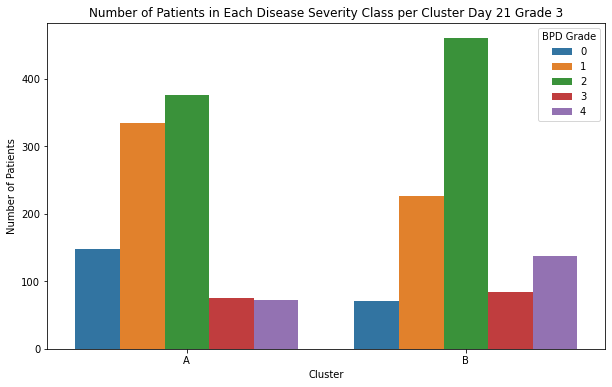

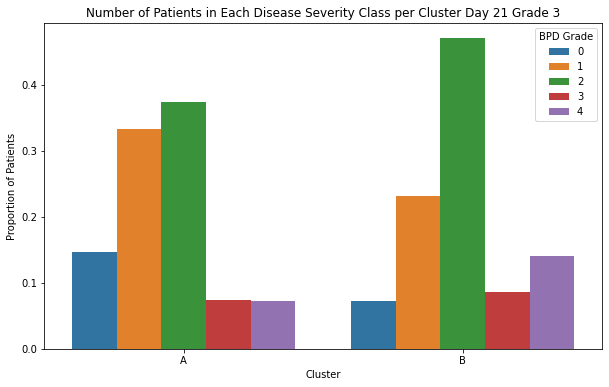

do_d27g3_t


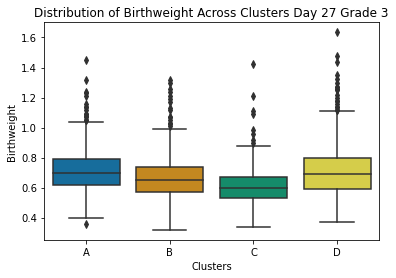

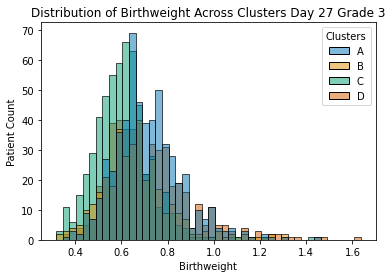

             Mean        SD
Cluster                    
A        0.711485  0.147568
B        0.665259  0.158705
C        0.604318  0.121479
D        0.721180  0.180454


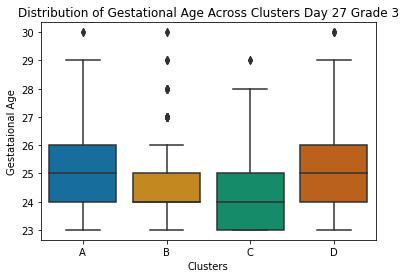

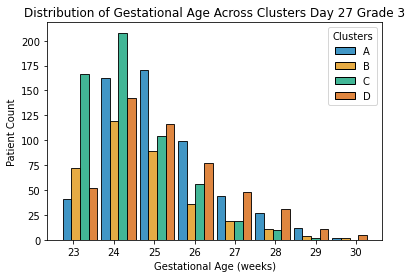

              Mean        SD
Cluster                     
A        25.144902  1.388162
B        24.630682  1.395953
C        24.275618  1.214225
D        25.184647  1.567979


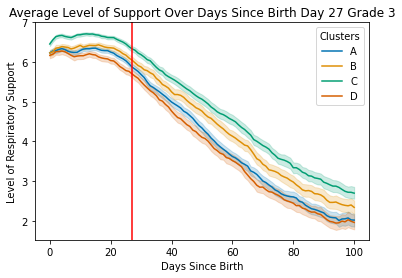

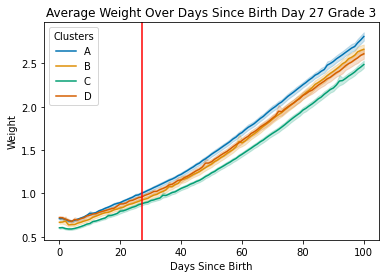

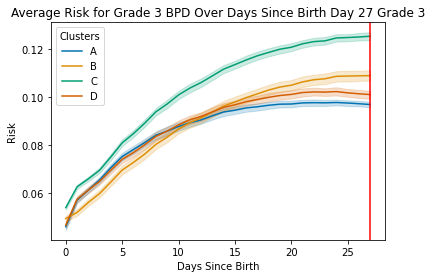

Average Risk Across Clusters
Cluster A: 0.09686523420876564
Cluster B: 0.10888688782840907
Cluster C: 0.12528050819805653
Cluster D: 0.10100914249066388


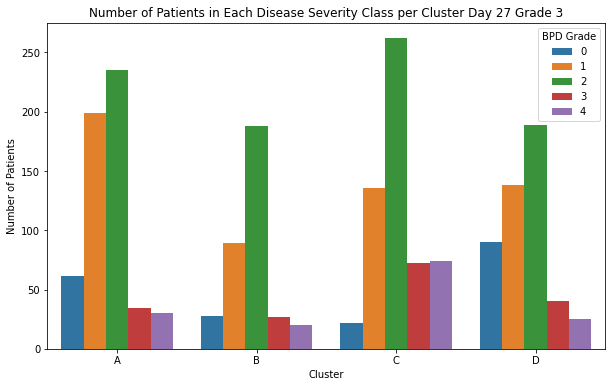

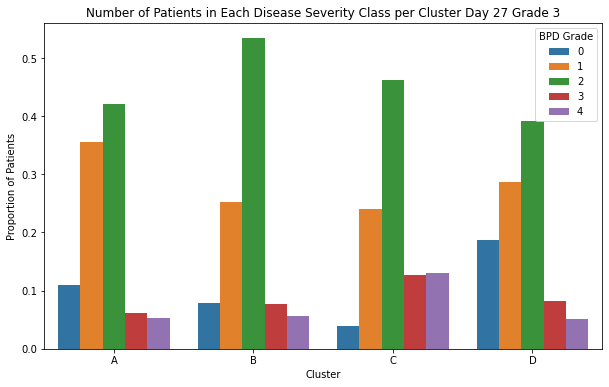

In [11]:
i = 0
for cluster, cluster_col in zip(clusters, cluster_cols):
    curr_c_df = pd.read_csv(CDATA_DIR_PATH + cluster + c_suffix)
    num_clusters = len(list(set(curr_c_df[cluster_col])))
    curr_df = curr_c_df.merge(pf_df).merge(dis_df)
    curr_ds_df = curr_c_df.merge(ds_df)
    curr_dw_df = curr_c_df.merge(dw_df)
    curr_dr_df = curr_c_df.merge(tar_df)
    curr_mr_df = pd.read_csv(RDATA_DIR_PATH + cluster.strip('t') + mr_suffix)
    curr_labels = labels[0:num_clusters]
    identifier = days_mapping[cluster]
    print(cluster)
    
    # Birthweight
    g = sns.boxplot(data=curr_df, x=cluster_col, y='BirthWeight', palette=new_pal)
    g.set_xticks(range(len(curr_labels)))
    g.set_xticklabels(curr_labels)
    plt.title('Distribution of Birthweight Across Clusters ' + identifier)
    plt.xlabel('Clusters')
    plt.ylabel('Birthweight')

    fig, ax1 = plt.subplots()
    sp1 = sns.histplot(data=curr_df, x='BirthWeight', hue=cluster_col, palette='colorblind', ax=ax1, 
                       multiple='layer',
                      )
    ax1.set_title('Distribution of Birthweight Across Clusters ' + identifier)
    ax1.set_ylabel('Patient Count')
    ax1.set_xlabel('Birthweight')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    plt.show()

    bw_means = curr_df.loc[:, [cluster_col, 'BirthWeight']].groupby(cluster_col).mean().reset_index()
    bw_means = list(bw_means['BirthWeight'])
    bw_sds = curr_df.loc[:, [cluster_col, 'BirthWeight']].groupby(cluster_col).std().reset_index()
    bw_sds = list(bw_sds['BirthWeight'])
    bw = pd.DataFrame({'Cluster': curr_labels, 'Mean': bw_means, 'SD': bw_sds}).set_index('Cluster')
    print(bw)
    # Gestational Age
    g = sns.boxplot(data=curr_df, x=cluster_col, y='GestAge', palette='colorblind')
    g.set_xticks(range(len(curr_labels)))
    g.set_xticklabels(curr_labels)
    plt.title('Distribution of Gestational Age Across Clusters ' + identifier)
    plt.xlabel('Clusters')
    plt.ylabel('Gestataional Age')

    fig, ax1 = plt.subplots()
    sp1 = sns.histplot(data=curr_df, x='GestAge', hue=cluster_col, palette='colorblind', ax=ax1, multiple='dodge',
                      shrink=2.7)
    ax1.set_title('Distribution of Gestational Age Across Clusters ' + identifier)
    ax1.set_ylabel('Patient Count')
    ax1.set_xlabel('Gestational Age (weeks)')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    plt.show()

    ga_means = curr_df.loc[:, [cluster_col, 'GestAge']].groupby(cluster_col).mean().reset_index()
    ga_means = list(ga_means['GestAge'])
    ga_sds = curr_df.loc[:, [cluster_col, 'GestAge']].groupby(cluster_col).std().reset_index()
    ga_sds = list(ga_sds['GestAge'])
    ga = pd.DataFrame({'Cluster': curr_labels, 'Mean': ga_means, 'SD': ga_sds}).set_index('Cluster')
    print(ga)

    # Support Type Trajectory
    fig, ax1 = plt.subplots()
    sp1 = sns.lineplot(data=curr_ds_df.loc[curr_ds_df['DSB'] <= 100], x='DSB', y='SupportType', 
                       hue=cluster_col, palette = 'colorblind', ax=ax1)
    ax1.set_title('Average Level of Support Over Days Since Birth ' + identifier)
    ax1.set_ylabel('Level of Respiratory Support')
    ax1.set_xlabel('Days Since Birth')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    ax1.axvline(x=days[i], c='red')
    plt.show()
  

    # Daily Weight Trajectory
    fig, ax1 = plt.subplots()
    sp1 = sns.lineplot(data=curr_dw_df.loc[curr_dw_df['Daily_DSB'] <= 100], x='Daily_DSB', y='Weight', 
                       hue=cluster_col, palette = 'colorblind', ax=ax1)
    ax1.set_title('Average Weight Over Days Since Birth ' + identifier)
    ax1.set_ylabel('Weight')
    ax1.set_xlabel('Days Since Birth')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    ax1.axvline(x=days[i], c='red')
    plt.show()
    
    
    # Severe BPD Risk Trajectory
    fig, ax1 = plt.subplots()
    sp1 = sns.lineplot(data=curr_dr_df.loc[curr_dr_df['DSB'] <= 100], x='DSB', y='grade_3_prob', 
                       hue=cluster_col, palette = 'colorblind', ax=ax1)
    ax1.set_title('Average Risk for Grade 3 BPD Over Days Since Birth ' + identifier)
    ax1.set_ylabel('Risk')
    ax1.set_xlabel('Days Since Birth')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    ax1.axvline(x=days[i], c='red')
    i += 1
    plt.show()

    # Risk Comparisons
    merged = curr_c_df.merge(curr_mr_df.loc[:, ['PatientSeqID', 'grade_3_prob']])
    avg_risks = list(merged.groupby(cluster_col).mean()['grade_3_prob'])
    print("Average Risk Across Clusters")
    for risk, lab in zip(avg_risks, curr_labels):
        print(f"Cluster {lab}: {risk}")
    
    
    # Purity Analysis
    grouped = curr_df.groupby([cluster_col, 'BPD Grade']).size().reset_index(name='counts')
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=cluster_col, y='counts', hue='BPD Grade', data=grouped)
    ax.set_xticklabels(curr_labels)
    plt.title('Number of Patients in Each Disease Severity Class per Cluster ' + identifier)
    plt.xlabel('Cluster')
    plt.ylabel('Number of Patients')
    plt.show()
    
    
    # Calculate total counts for each 'umap_KMeans'
    totals = curr_df.groupby(cluster_col).size().reset_index(name='total_counts')

    # Calculate counts for each combination of 'umap_KMeans' and 'BPD Grade'
    grouped = curr_df.groupby([cluster_col, 'BPD Grade']).size().reset_index(name='counts')

    # Merge the total counts into grouped DataFrame
    grouped = pd.merge(grouped, totals, on=cluster_col)

    # Calculate normalized counts
    grouped['normalized_counts'] = grouped['counts'] / grouped['total_counts']

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=cluster_col, y='normalized_counts', hue='BPD Grade', data=grouped)
    ax.set_xticklabels(curr_labels)
    plt.title('Number of Patients in Each Disease Severity Class per Cluster ' + identifier)
    plt.xlabel('Cluster')
    plt.ylabel('Proportion of Patients')  # Update y label
    plt.show()
    

do_d1g3_t


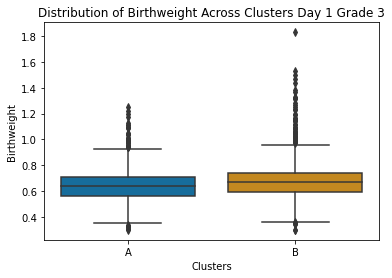

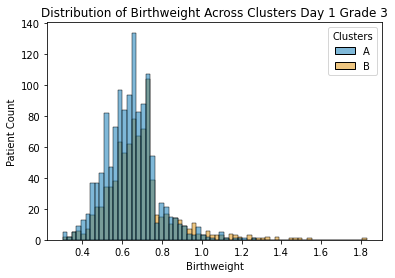

             Mean        SD
Cluster                    
A        0.640947  0.127208
B        0.685939  0.167179


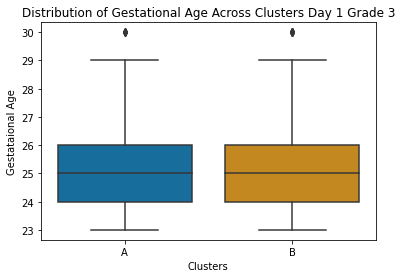

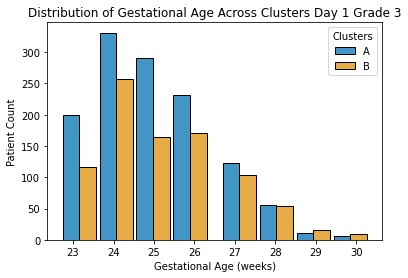

              Mean        SD
Cluster                     
A        24.990369  1.466051
B        25.174157  1.583096


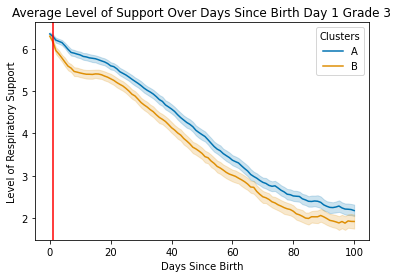

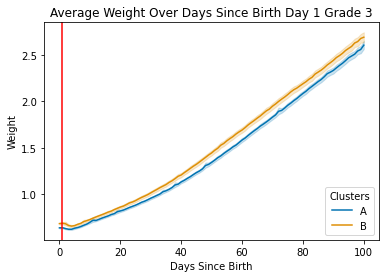

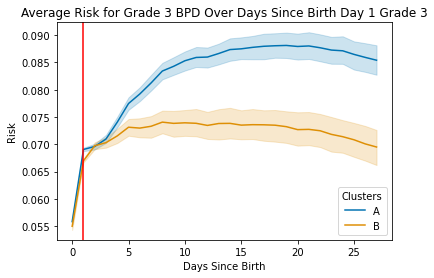

Average Risk Across Clusters
Cluster A: 0.06904107346725522
Cluster B: 0.06695608790292135


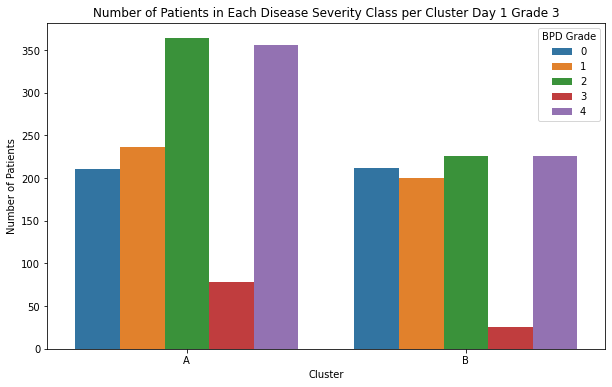

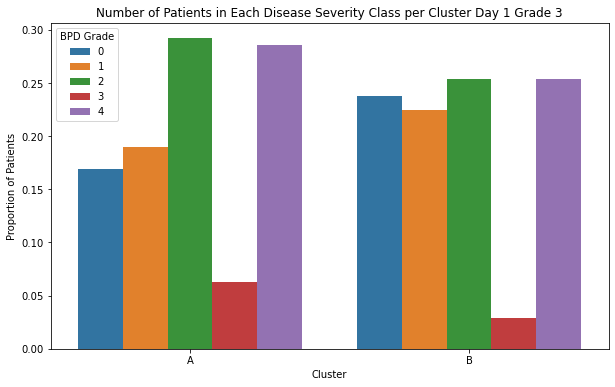

do_d3g3_t


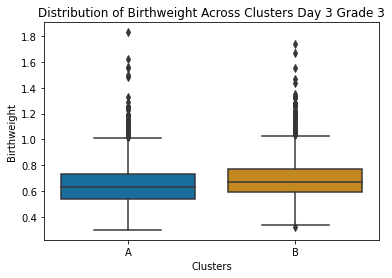

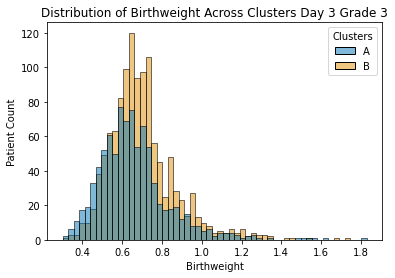

             Mean        SD
Cluster                    
A        0.659296  0.182233
B        0.700040  0.171643


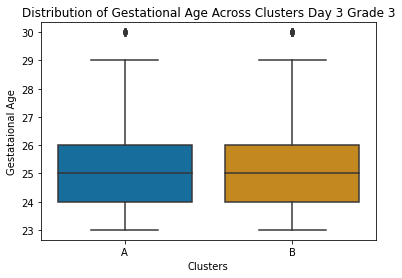

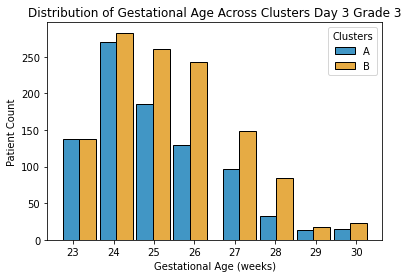

              Mean        SD
Cluster                     
A        25.007946  1.593647
B        25.353333  1.621423


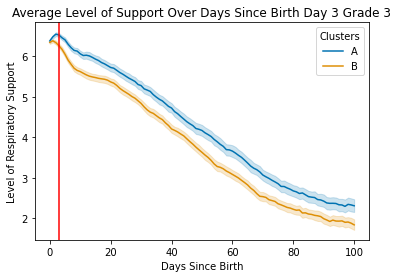

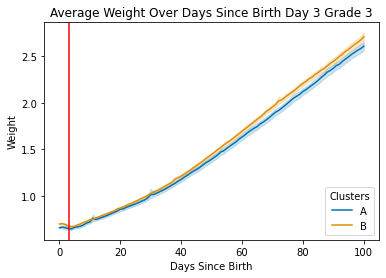

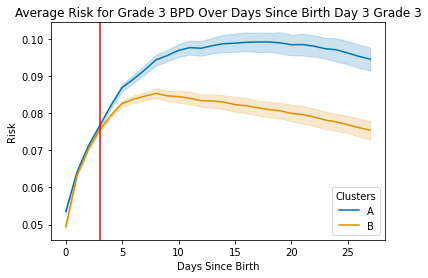

Average Risk Across Clusters
Cluster A: 0.07659247134948921
Cluster B: 0.07546998338316666


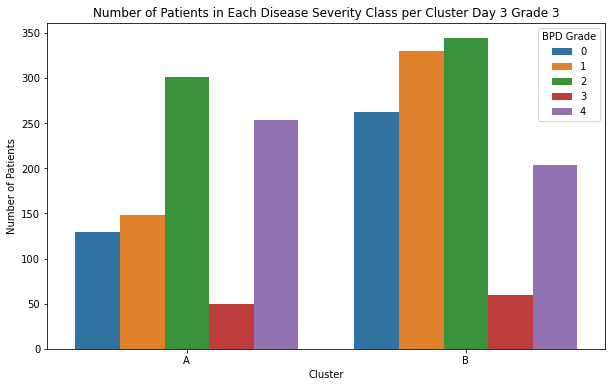

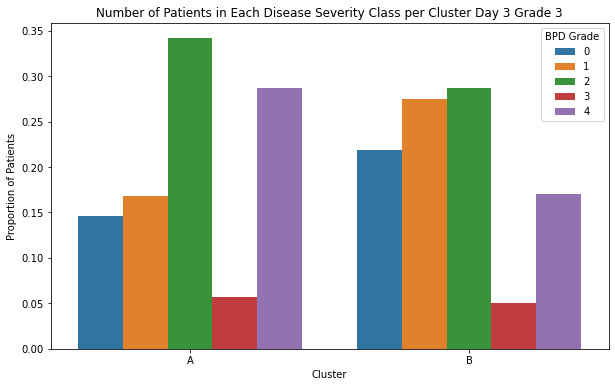

do_d7g3_t


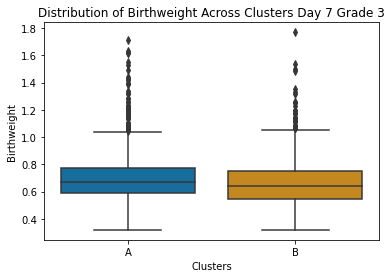

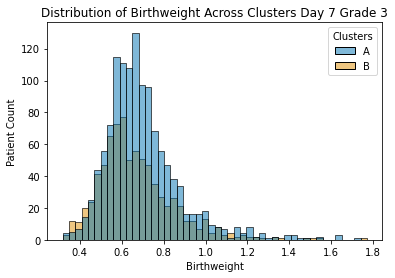

             Mean        SD
Cluster                    
A        0.698930  0.181627
B        0.668546  0.184207


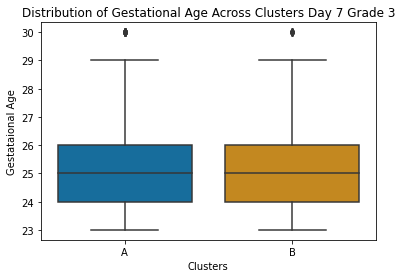

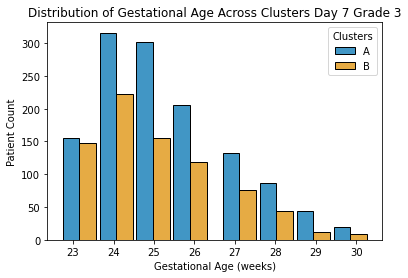

              Mean        SD
Cluster                     
A        25.298176  1.671395
B        24.970775  1.615104


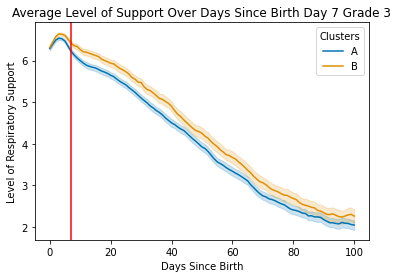

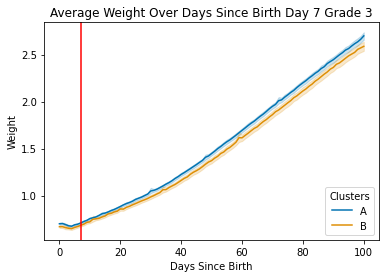

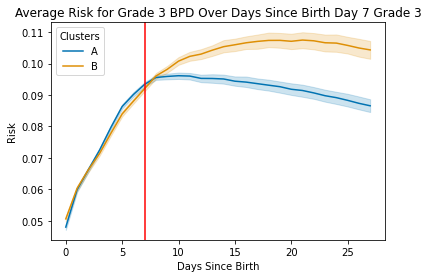

Average Risk Across Clusters
Cluster A: 0.09340796187160982
Cluster B: 0.09205020277674714


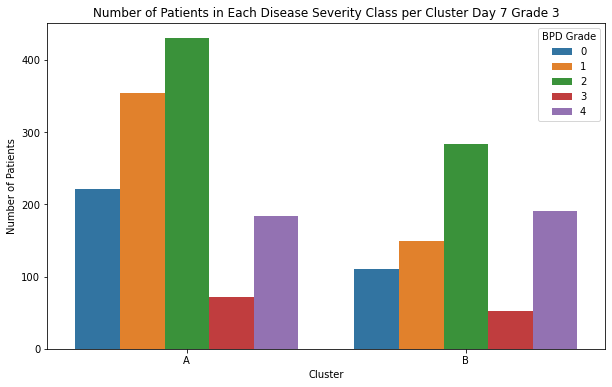

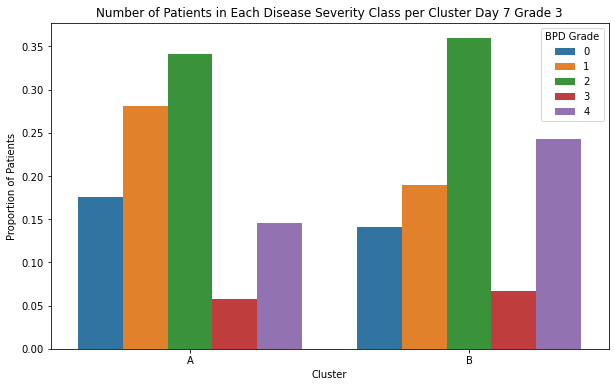

do_d14g3_t


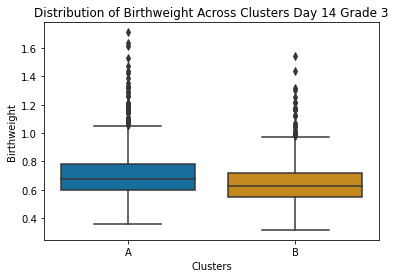

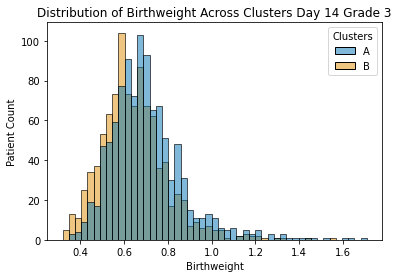

             Mean        SD
Cluster                    
A        0.704302  0.172081
B        0.643766  0.152973


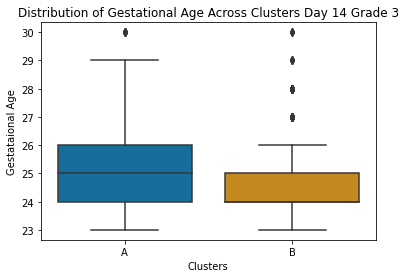

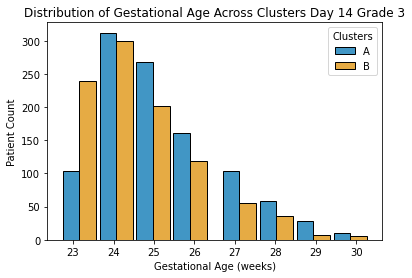

              Mean        SD
Cluster                     
A        25.175287  1.544769
B        24.596054  1.442547


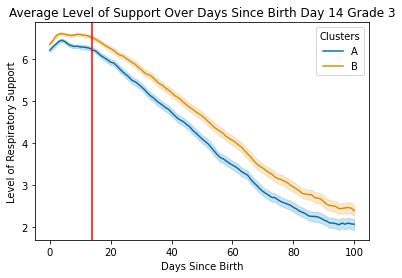

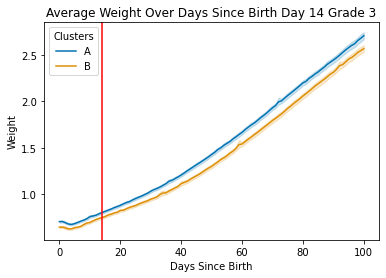

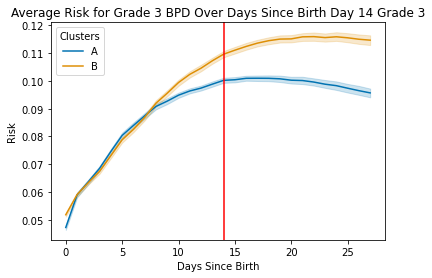

Average Risk Across Clusters
Cluster A: 0.10021909905172412
Cluster B: 0.10964776719023883


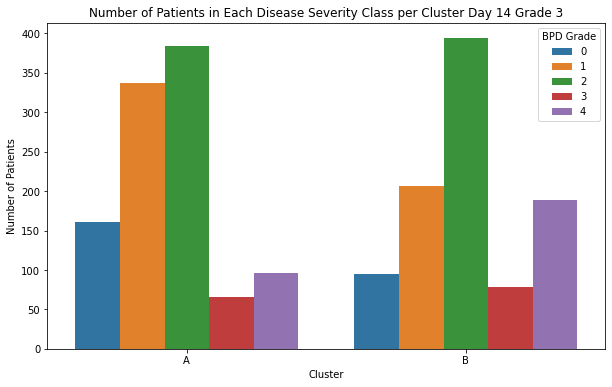

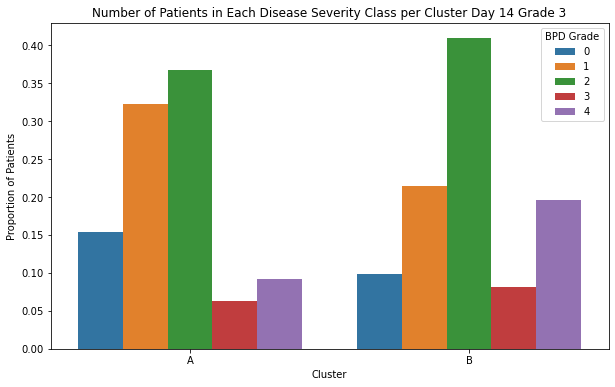

do_d21g3_t


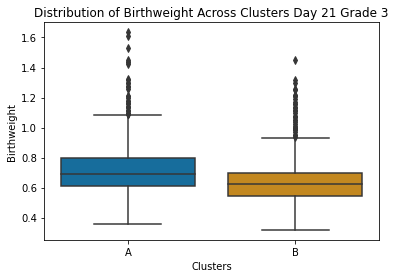

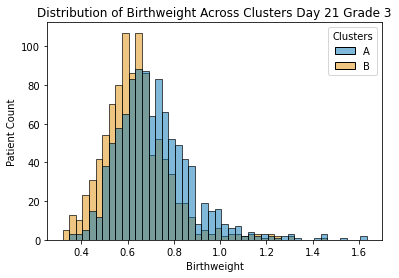

             Mean        SD
Cluster                    
A        0.714214  0.165738
B        0.636340  0.146518


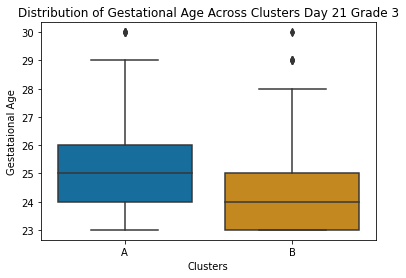

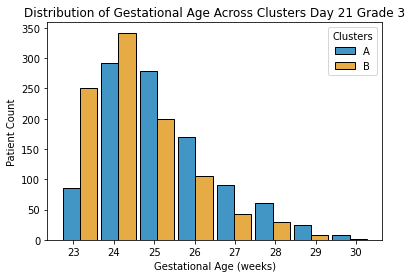

              Mean        SD
Cluster                     
A        25.201589  1.493551
B        24.462168  1.347920


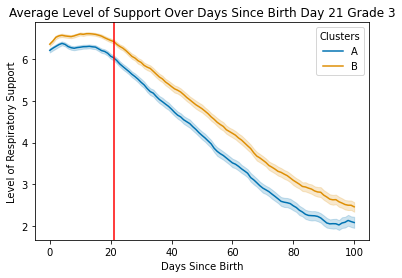

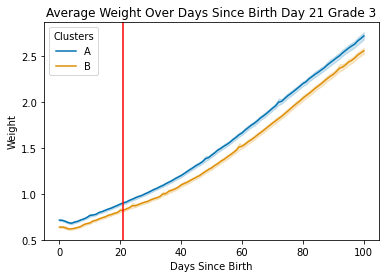

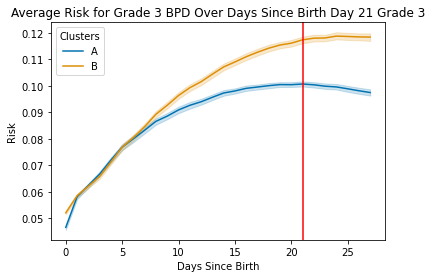

Average Risk Across Clusters
Cluster A: 0.10066686309473684
Cluster B: 0.11734491941083844


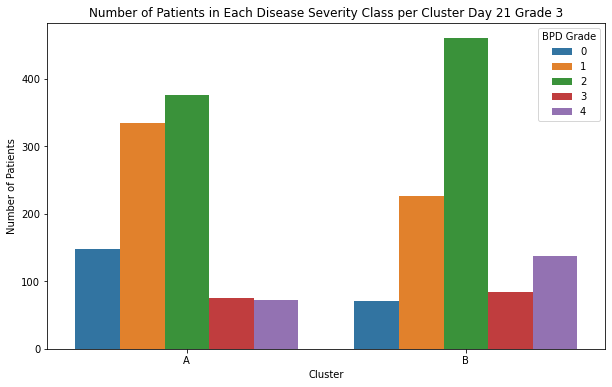

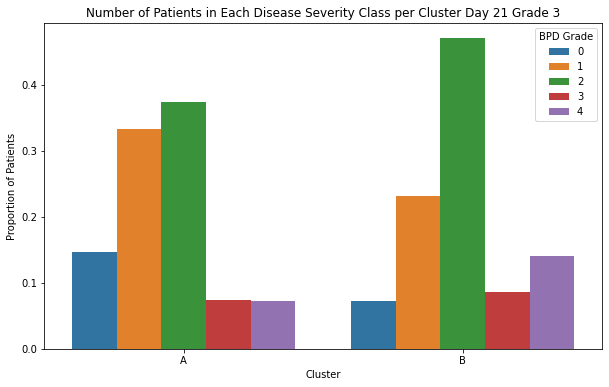

do_d27g3_t


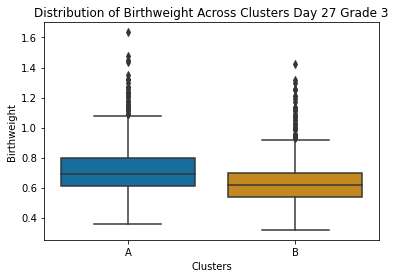

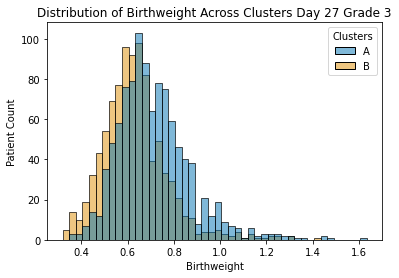

             Mean        SD
Cluster                    
A        0.713631  0.161980
B        0.630793  0.144006


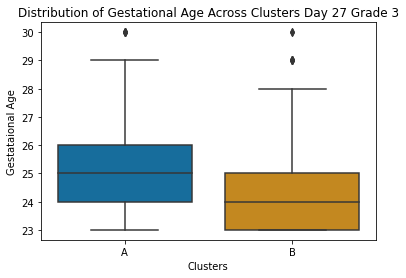

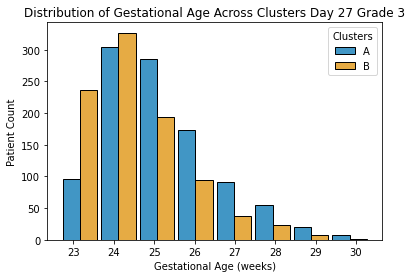

              Mean       SD
Cluster                    
A        25.139961  1.46347
B        24.442037  1.32703


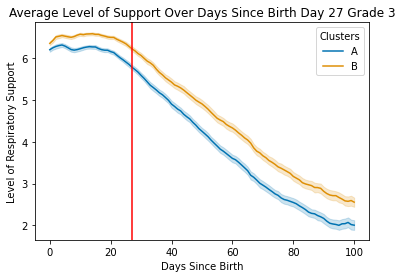

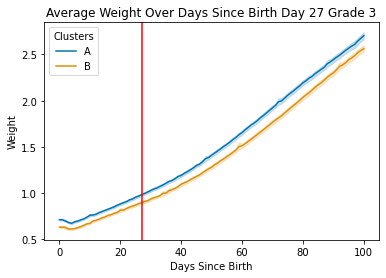

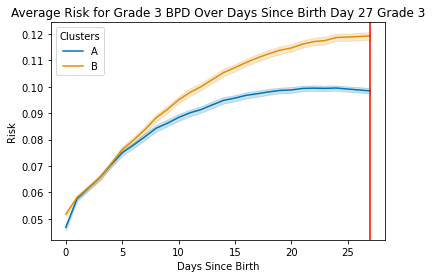

Average Risk Across Clusters
Cluster A: 0.09845073311833975
Cluster B: 0.11925900893640301


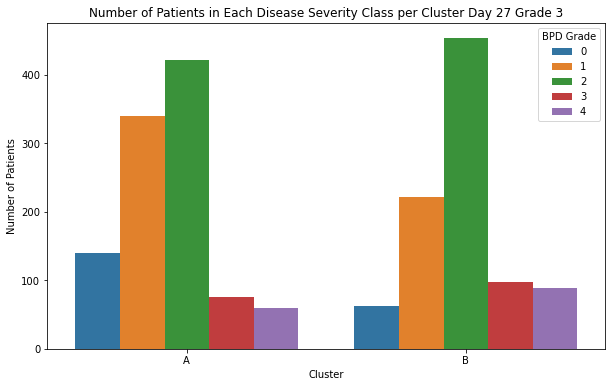

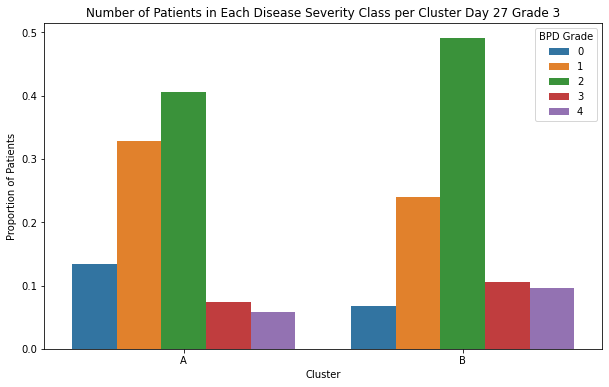

In [12]:
i = 0
cluster_col = 'umap_KMeans_2'
for cluster in clusters:
    curr_c_df = pd.read_csv(CDATA_DIR_PATH + cluster + c_suffix)
    num_clusters = len(list(set(curr_c_df[cluster_col])))
    curr_df = curr_c_df.merge(pf_df).merge(dis_df)
    curr_ds_df = curr_c_df.merge(ds_df)
    curr_dw_df = curr_c_df.merge(dw_df)
    curr_dr_df = curr_c_df.merge(tar_df)
    curr_mr_df = pd.read_csv(RDATA_DIR_PATH + cluster.strip('t') + mr_suffix)
    curr_labels = labels[0:num_clusters]
    identifier = days_mapping[cluster]
    print(cluster)
    
    # Birthweight
    g = sns.boxplot(data=curr_df, x=cluster_col, y='BirthWeight', palette=new_pal)
    g.set_xticks(range(len(curr_labels)))
    g.set_xticklabels(curr_labels)
    plt.title('Distribution of Birthweight Across Clusters ' + identifier)
    plt.xlabel('Clusters')
    plt.ylabel('Birthweight')

    fig, ax1 = plt.subplots()
    sp1 = sns.histplot(data=curr_df, x='BirthWeight', hue=cluster_col, palette='colorblind', ax=ax1, 
                       multiple='layer',
                      )
    ax1.set_title('Distribution of Birthweight Across Clusters ' + identifier)
    ax1.set_ylabel('Patient Count')
    ax1.set_xlabel('Birthweight')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    plt.show()

    bw_means = curr_df.loc[:, [cluster_col, 'BirthWeight']].groupby(cluster_col).mean().reset_index()
    bw_means = list(bw_means['BirthWeight'])
    bw_sds = curr_df.loc[:, [cluster_col, 'BirthWeight']].groupby(cluster_col).std().reset_index()
    bw_sds = list(bw_sds['BirthWeight'])
    bw = pd.DataFrame({'Cluster': curr_labels, 'Mean': bw_means, 'SD': bw_sds}).set_index('Cluster')
    print(bw)
    # Gestational Age
    g = sns.boxplot(data=curr_df, x=cluster_col, y='GestAge', palette='colorblind')
    g.set_xticks(range(len(curr_labels)))
    g.set_xticklabels(curr_labels)
    plt.title('Distribution of Gestational Age Across Clusters ' + identifier)
    plt.xlabel('Clusters')
    plt.ylabel('Gestataional Age')

    fig, ax1 = plt.subplots()
    sp1 = sns.histplot(data=curr_df, x='GestAge', hue=cluster_col, palette='colorblind', ax=ax1, multiple='dodge',
                      shrink=2.7)
    ax1.set_title('Distribution of Gestational Age Across Clusters ' + identifier)
    ax1.set_ylabel('Patient Count')
    ax1.set_xlabel('Gestational Age (weeks)')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    plt.show()

    ga_means = curr_df.loc[:, [cluster_col, 'GestAge']].groupby(cluster_col).mean().reset_index()
    ga_means = list(ga_means['GestAge'])
    ga_sds = curr_df.loc[:, [cluster_col, 'GestAge']].groupby(cluster_col).std().reset_index()
    ga_sds = list(ga_sds['GestAge'])
    ga = pd.DataFrame({'Cluster': curr_labels, 'Mean': ga_means, 'SD': ga_sds}).set_index('Cluster')
    print(ga)

    # Support Type Trajectory
    fig, ax1 = plt.subplots()
    sp1 = sns.lineplot(data=curr_ds_df.loc[curr_ds_df['DSB'] <= 100], x='DSB', y='SupportType', 
                       hue=cluster_col, palette = 'colorblind', ax=ax1)
    ax1.set_title('Average Level of Support Over Days Since Birth ' + identifier)
    ax1.set_ylabel('Level of Respiratory Support')
    ax1.set_xlabel('Days Since Birth')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    ax1.axvline(x=days[i], c='red')
    plt.show()
  

    # Daily Weight Trajectory
    fig, ax1 = plt.subplots()
    sp1 = sns.lineplot(data=curr_dw_df.loc[curr_dw_df['Daily_DSB'] <= 100], x='Daily_DSB', y='Weight', 
                       hue=cluster_col, palette = 'colorblind', ax=ax1)
    ax1.set_title('Average Weight Over Days Since Birth ' + identifier)
    ax1.set_ylabel('Weight')
    ax1.set_xlabel('Days Since Birth')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    ax1.axvline(x=days[i], c='red')
    plt.show()
    
    
    # Severe BPD Risk Trajectory
    fig, ax1 = plt.subplots()
    sp1 = sns.lineplot(data=curr_dr_df.loc[curr_dr_df['DSB'] <= 100], x='DSB', y='grade_3_prob', 
                       hue=cluster_col, palette = 'colorblind', ax=ax1)
    ax1.set_title('Average Risk for Grade 3 BPD Over Days Since Birth ' + identifier)
    ax1.set_ylabel('Risk')
    ax1.set_xlabel('Days Since Birth')
    legend = ax1.get_legend()
    handles = legend.legendHandles
    legend.remove()
    ax1.legend(handles, curr_labels, title='Clusters')
    ax1.axvline(x=days[i], c='red')
    i += 1
    plt.show()

    # Risk Comparisons
    merged = curr_c_df.merge(curr_mr_df.loc[:, ['PatientSeqID', 'grade_3_prob']])
    avg_risks = list(merged.groupby(cluster_col).mean()['grade_3_prob'])
    print("Average Risk Across Clusters")
    for risk, lab in zip(avg_risks, curr_labels):
        print(f"Cluster {lab}: {risk}")
    
    
    # Purity Analysis
    grouped = curr_df.groupby([cluster_col, 'BPD Grade']).size().reset_index(name='counts')
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=cluster_col, y='counts', hue='BPD Grade', data=grouped)
    ax.set_xticklabels(curr_labels)
    plt.title('Number of Patients in Each Disease Severity Class per Cluster ' + identifier)
    plt.xlabel('Cluster')
    plt.ylabel('Number of Patients')
    plt.show()
    
    
    # Calculate total counts for each 'umap_KMeans'
    totals = curr_df.groupby(cluster_col).size().reset_index(name='total_counts')

    # Calculate counts for each combination of 'umap_KMeans' and 'BPD Grade'
    grouped = curr_df.groupby([cluster_col, 'BPD Grade']).size().reset_index(name='counts')

    # Merge the total counts into grouped DataFrame
    grouped = pd.merge(grouped, totals, on=cluster_col)

    # Calculate normalized counts
    grouped['normalized_counts'] = grouped['counts'] / grouped['total_counts']

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=cluster_col, y='normalized_counts', hue='BPD Grade', data=grouped)
    ax.set_xticklabels(curr_labels)
    plt.title('Number of Patients in Each Disease Severity Class per Cluster ' + identifier)
    plt.xlabel('Cluster')
    plt.ylabel('Proportion of Patients')  # Update y label
    plt.show()
    

### Feature Importance Analysis

In [ ]:
do_v_df = pd.read_csv(VDATA_DIR_PATH + 'do_v_df.csv')


In [ ]:
clusters = ['do_d1g3_t', 'do_d3g3_t', 'do_d7g3_t', 'do_d14g3_t', 'do_d21g3_t', 'do_d27g3_t']
cluster_cols = ['umap_KMeans_4', 'umap_KMeans_3', 'umap_KMeans_4', 'umap_KMeans_4', 'umap_KMeans_2', 'umap_KMeans_4']
labels = ['A', 'B', 'C', 'D', 'E', 'F']
days = [1, 3, 7, 14, 21, 27]
grades = [3]
categories = [f"Day {day} Grade {grade}" for day in days for grade in grades]
days_mapping = dict(zip(clusters, categories))
c_suffix = 'c_df.csv'
mr_suffix = 'mr_df.csv'

In [36]:
do_d1g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d1g3_t' + c_suffix)
do_d3g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d3g3_t' + c_suffix)
do_d7g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d7g3_t' + c_suffix)
do_d14g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d14g3_t' + c_suffix)
do_d21g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d21g3_t' + c_suffix)
do_d27g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d27g3_t' + c_suffix)


In [37]:
do_d1g3_t_df

,PatientSeqID,umap_KMeans_2,umap_KMeans_3,umap_KMeans_4,umap_KMeans_5,umap_KMeans_6
0,5231421,0,1,0,0,0
1,5232015,0,1,0,3,3
2,5232231,0,1,0,3,3
3,5232309,1,0,1,3,3
4,5232702,0,1,0,0,0
...,...,...,...,...,...,...
2131,6555846,0,1,0,0,0
2132,6557414,0,1,3,1,1
2133,6557648,1,0,3,1,1
2134,6560532,0,1,3,1,1


In [ ]:
def make_X(df):
    # assuming the vectorized dataframes are all constructed with only column 0, PatientSeqID,
    # to be removed from the values
    X = df.iloc[:, 1:].values
    X = StandardScaler().fit_transform(X)
    return X

In [ ]:
def find_importances(v_df, c_df, cluster_col):
    vc_df = c_df.loc[:, ['PatientSeqID', cluster_col]].merge(v_df)
    ft_df = vc_df.loc[:, ['PatientSeqID'] + list(vc_df.columns[2:])]
    X = make_X(ft_df)
    y = np.array(vc_df[cluster_col])
    # define the model
    model = RandomForestClassifier()
    # fit the model
    model.fit(X, y)
    # get importance
    importance = model.feature_importances_
    features = ft_df.columns[1:]
    imp_dict = dict()
    # summarize feature importance
    for v, name in zip(importance, features):
        print('Feature:', name, 'Score: %.5f' % (v))
        imp_dict[name] = v
    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.title('Relative Importance of Features')
    plt.xlabel('Feature ID')
    plt.ylabel('Relative Importance')
    plt.show()
    return imp_dict, importance

In [ ]:
do_d1g3_t_df = pd.read_csv(CDATA_DIR_PATH + 'do_d1g3_t' + c_suffix)

In [ ]:
do_d1_dict, do_d1_importance = find_importances(do_v_df, do_d1g3_t_df)
do_d3_dict, do_d3_importance = find_importances(do_v_df, do_d3g3_t_df)
do_d7_dict, do_d7_importance = find_importances(do_v_df, do_d7g3_t_df
do_d14_dict, do_d14_importance = find_importances(do_v_df, do_d14g3_t_df)
do_d21_dict, do_d21_importance = find_importances(do_v_df, do_d21g3_t_df
do_d27_dict, do_d27_importance = find_importances(do_v_df, do_d27g3_t_df)

In [ ]:
index_order = np.argsort(importance)
top_50 = list(index_order[-100:])
top_50.reverse()
print('Top 50 Raw Data Variables Ranked in Importance')
for i, ind in enumerate(top_50):
    print(i+1, features[ind], ':', '{:0.4f}'.format(importance[ind]))

In [ ]:
lfts = [features[ft] for ft in range(0, len(imp_values)-38, 21)] # longitudinal
print(lfts)


In [ ]:
# feature names
lfts = [features[ft].split('0')[0] for ft in range(0, len(imp_values)-38, 21)]
imp_values = list(imp_dict.values())
lft_sums = [np.sum(np.array(imp_values[i:i+21])) for i in range(0, len(imp_values)-38, 21)]

In [ ]:
np.sum(np.array(lft_sums) > 0.0)

In [ ]:
features[-17:]

In [ ]:
all_fts = lfts + list(features)[-17:]
all_sums = lft_sums + imp_values[-17:]

In [ ]:
index_order = np.argsort(all_sums)
top_103 = list(index_order[-101:])
top_103.reverse()
print('Cumulative Variable Importance Over 21 Days')
for i, ind in enumerate(top_103):
    print(i+1, all_fts[ind], ':', '{:0.4f}'.format(all_sums[ind]))

In [ ]:
# tmgat1cv_df = tgat1c_df.merge(mg3t1v_df)
tmgat1cv_df = tmgat1cv_df.dropna()
ft_df = tmgat1cv_df.loc[:, ['PatientSeqID'] + list(tmgat1cv_df.columns[7:])]

In [ ]:
# define dataset
X = make_X(ft_df)
y = np.array(tmgat1cv_df['umap_KMeans'])
# define the model
model = RandomForestClassifier()
# fit the model
model.fit(X, y)
# get importance
importance = model.feature_importances_
features = ft_df.columns[1:]
imp_dict = dict()
# summarize feature importance
for v, name in zip(importance, features):
    print('Feature:', name, 'Score: %.5f' % (v))
    imp_dict[name] = v
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.title('Relative Importance of Features')
plt.xlabel('Feature ID')
plt.ylabel('Relative Importance')
plt.show()
print(imp_dict)

In [ ]:
lfts = [features[ft] for ft in range(0, len(imp_values)-38, 21)]

In [ ]:
# feature names
lfts = [features[ft].split('0')[0] for ft in range(0, len(imp_values)-38, 21)]
imp_values = list(imp_dict.values())
lft_sums = [np.sum(np.array(imp_values[i:i+21])) for i in range(0, len(imp_values)-38, 21)]

In [ ]:
np.sum(np.array(lft_sums) > 0.0)

In [ ]:
features[-17:]

In [ ]:
all_fts = lfts + list(features)[-17:]
all_sums = lft_sums + imp_values[-17:]

In [ ]:
index_order = np.argsort(all_sums)
top_103 = list(index_order[-101:])
top_103.reverse()
print('Cumulative Variable Importance Over 21 Days')
for i, ind in enumerate(top_103):
    print(i+1, all_fts[ind], ':', '{:0.4f}'.format(all_sums[ind]))

In [ ]:
index_order = np.argsort(importance)
top_50 = list(index_order[-100:])
top_50.reverse()
print('Top 50 Raw Data Variables Ranked in Importance')
for i, ind in enumerate(top_50):
    print(i+1, features[ind], ':', '{:0.4f}'.format(importance[ind]))

In [ ]:
dm_df.head()

#### Sankey Plots

In [13]:
do_d1g3_mr_df = pd.read_csv(RDATA_DIR_PATH + 'do_d1g3_mr_df.csv')
do_d3g3_mr_df = pd.read_csv(RDATA_DIR_PATH + 'do_d3g3_mr_df.csv')
do_d7g3_mr_df = pd.read_csv(RDATA_DIR_PATH + 'do_d7g3_mr_df.csv')
do_d14g3_mr_df = pd.read_csv(RDATA_DIR_PATH + 'do_d14g3_mr_df.csv')
do_d21g3_mr_df = pd.read_csv(RDATA_DIR_PATH + 'do_d21g3_mr_df.csv')

In [15]:
# Reload the provided CSVs and Extract patient identifiers
df_d1 = pd.read_csv(RDATA_DIR_PATH + 'do_d1g3_mr_df.csv')
df_d3 = pd.read_csv(RDATA_DIR_PATH + 'do_d3g3_mr_df.csv')
df_d7 = pd.read_csv(RDATA_DIR_PATH + 'do_d7g3_mr_df.csv')
df_d14 = pd.read_csv(RDATA_DIR_PATH + 'do_d14g3_mr_df.csv')
df_d21 = pd.read_csv(RDATA_DIR_PATH + 'do_d21g3_mr_df.csv')
df_d27 = pd.read_csv(RDATA_DIR_PATH + 'do_d27g3_mr_df.csv')

discharge_bpd_df = pd.read_csv(DATA_DIR_PATH + 'discharge_bpd_status.csv')

# Extract the patient identifiers for each day
patients_d1 = set(df_d1['PatientSeqID'])
patients_d3 = set(df_d3['PatientSeqID'])
patients_d7 = set(df_d7['PatientSeqID'])
patients_d14 = set(df_d14['PatientSeqID'])
patients_d21 = set(df_d21['PatientSeqID'])
patients_d27 = set(df_d27['PatientSeqID'])
patients_discharge_status = set(discharge_bpd_df['PatientSeqID'])

# Create the transitions
sankey_data = []

# Helper function to add data for each transition
def add_sankey_data(source, target_continued, target_new, continued, new):
    sankey_data.append({'source': source, 'target': target_continued, 'value': len(continued)})
    sankey_data.append({'source': source, 'target': target_new, 'value': len(new)})

# Day 1 to Day 3
continued_d3 = patients_d1.intersection(patients_d3)
new_d3 = patients_d3 - patients_d1
add_sankey_data("Day1 Top 10%", "Day3 Continued", "Day3 New", continued_d3, new_d3)

# Day 3 to Day 7
continued_d7 = patients_d3.intersection(patients_d7)
new_d7 = patients_d7 - patients_d3
add_sankey_data("Day3 Top 10%", "Day7 Continued", "Day7 New", continued_d7, new_d7)

# Day 7 to Day 14
continued_d14 = patients_d7.intersection(patients_d14)
new_d14 = patients_d14 - patients_d7
add_sankey_data("Day7 Top 10%", "Day14 Continued", "Day14 New", continued_d14, new_d14)

# Day 14 to Day 21
continued_d21 = patients_d14.intersection(patients_d21)
new_d21 = patients_d21 - patients_d14
add_sankey_data("Day14 Top 10%", "Day21 Continued", "Day21 New", continued_d21, new_d21)

# Day 21 to Day 27
continued_d27 = patients_d21.intersection(patients_d27)
new_d27 = patients_d27 - patients_d21
add_sankey_data("Day21 Top 10%", "Day27 Continued", "Day27 New", continued_d27, new_d27)

# Day 27 to Discharge
bpd_grades = discharge_bpd_df.set_index('PatientSeqID')['BPD Grade'].to_dict()
discharge_status_labels = {-1: "Premature Death", 0: "No BPD", 1: "Grade 1 BPD", 2: "Grade 2 BPD", 3: "Grade 3 BPD"}
for grade, label in discharge_status_labels.items():
    patients_with_grade = set([pid for pid, g in bpd_grades.items() if g == grade])
    add_sankey_data("Day27 Top 10%", label, label, patients_with_grade.intersection(patients_d27), patients_with_grade - patients_d27)

# Convert to DataFrame
sankey_df = pd.DataFrame(sankey_data)
sankey_df.head()


,source,target,value
0,Day1 Top 10%,Day3 Continued,1336
1,Day1 Top 10%,Day3 New,745
2,Day3 Top 10%,Day7 Continued,1493
3,Day3 Top 10%,Day7 New,555
4,Day7 Top 10%,Day14 Continued,1480


In [16]:
sankey_df

,source,target,value
0,Day1 Top 10%,Day3 Continued,1336
1,Day1 Top 10%,Day3 New,745
2,Day3 Top 10%,Day7 Continued,1493
3,Day3 Top 10%,Day7 New,555
4,Day7 Top 10%,Day14 Continued,1480
5,Day7 Top 10%,Day14 New,527
6,Day14 Top 10%,Day21 Continued,1715
7,Day14 Top 10%,Day21 New,270
8,Day21 Top 10%,Day27 Continued,1782
9,Day21 Top 10%,Day27 New,177


In [18]:
# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Define colors for each category
color_dict = {
    'Day1 Top 10%': 'red',
    'Day3 Top 10%': 'red',
    'Day7 Top 10%': 'red',
    'Day14 Top 10%': 'red',
    'Day21 Top 10%': 'red',
    'Day27 Top 10%': 'red',
    'Day3 Continued': 'blue',
    'Day3 New': 'orange',
    'Day7 Continued': 'blue',
    'Day7 New': 'orange',
    'Day14 Continued': 'blue',
    'Day14 New': 'orange',
    'Day21 Continued': 'blue',
    'Day21 New': 'orange',
    'Day27 Continued': 'blue',
    'Day27 New': 'orange',
    'Premature Death': 'black',
    'No BPD': 'limegreen',
    'Grade 1 BPD': 'yellow',
    'Grade 2 BPD': 'darkorange',
    'Grade 3 BPD': 'darkred'
}
color_list = [color_dict[label] for label in label_list]

import plotly.graph_objects as go

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
    )
)])

fig.update_layout(title_text="Patient Progression", font_size=10)
fig.show()


In [19]:
# Helper function to create the source and target data for sankey
def create_transition_data(source_prefix, target_prefix, continued, new, previous_new_label=None):
    data = []
    # Continued
    data.append({'source': f"{source_prefix} Top 10%", 'target': f"{target_prefix} Top 10%", 'value': len(continued)})
    
    # Not in
    data.append({'source': f"{source_prefix} Top 10%", 'target': f"Not in {target_prefix} Top 10%", 'value': len(continued - new)})
    
    # New (if provided)
    if previous_new_label:
        data.append({'source': previous_new_label, 'target': f"{target_prefix} Top 10%", 'value': len(new)})
    return data

# Start with Day 1
sankey_data = []

# Day 1 to Day 3
sankey_data.extend(create_transition_data("Day1", "Day3", continued_d3, new_d3))

# Day 3 to Day 7
sankey_data.extend(create_transition_data("Day3", "Day7", continued_d7, new_d7, "Not in Day3 Top 10%"))

# Day 7 to Day 14
sankey_data.extend(create_transition_data("Day7", "Day14", continued_d14, new_d14, "Not in Day7 Top 10%"))

# Day 14 to Day 21
sankey_data.extend(create_transition_data("Day14", "Day21", continued_d21, new_d21, "Not in Day14 Top 10%"))

# Day 21 to Day 27
sankey_data.extend(create_transition_data("Day21", "Day27", continued_d27, new_d27, "Not in Day21 Top 10%"))

# Day 27 to Discharge
for grade, label in discharge_status_labels.items():
    patients_with_grade = set([pid for pid, g in bpd_grades.items() if g == grade])
    sankey_data.append({'source': "Day27 Top 10%", 'target': label, 'value': len(patients_with_grade.intersection(continued_d27))})
    sankey_data.append({'source': "Not in Day27 Top 10%", 'target': label, 'value': len(patients_with_grade - continued_d27)})

# Convert to DataFrame
sankey_df = pd.DataFrame(sankey_data)

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Colors
color_dict = {
    'Day1 Top 10%': 'green',
    'Day3 Top 10%': 'blue',
    'Not in Day3 Top 10%': 'orange',
    'Day7 Top 10%': 'blue',
    'Not in Day7 Top 10%': 'orange',
    'Day14 Top 10%': 'blue',
    'Not in Day14 Top 10%': 'orange',
    'Day21 Top 10%': 'blue',
    'Not in Day21 Top 10%': 'orange',
    'Day27 Top 10%': 'blue',
    'Not in Day27 Top 10%': 'orange',
    'Premature Death': 'black',
    'No BPD': 'limegreen',
    'Grade 1 BPD': 'yellow',
    'Grade 2 BPD': 'darkorange',
    'Grade 3 BPD': 'darkred'
}
color_list = [color_dict.get(label, "grey") for label in label_list]  # default to grey for any missing labels

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
    )
)])

fig.update_layout(title_text="Patient Progression", font_size=10)
fig.show()


In [23]:
# Determine the cumulative set of patients who were in the top 10% up to Day 27
cumulative_top_10_percent_patients = patients_d1.union(patients_d3, patients_d7, patients_d14, patients_d21, patients_d27)

# Filter the discharge data to only include these patients
filtered_discharge_df = discharge_bpd_df[discharge_bpd_df['PatientSeqID'].isin(cumulative_top_10_percent_patients)]
bpd_grades_filtered = filtered_discharge_df.set_index('PatientSeqID')['BPD Grade'].to_dict()

# Update the transition from Day 27 to discharge to only consider these patients
sankey_data = [item for item in sankey_data if item['source'] != "Day27 Top 10%" or item['target'] not in discharge_status_labels.values()]

for grade, label in discharge_status_labels.items():
    patients_with_grade = set([pid for pid, g in bpd_grades_filtered.items() if g == grade])
    sankey_data.append({'source': "Day27 Top 10%", 'target': label, 'value': len(patients_with_grade.intersection(continued_d27))})
    sankey_data.append({'source': "Not in Day27 Top 10%", 'target': label, 'value': len(patients_with_grade - continued_d27)})

# Convert to DataFrame
sankey_df = pd.DataFrame(sankey_data)

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Create the Sankey diagram figure again
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
    )
)])

fig.update_layout(title_text="Patient Progression", font_size=10)
fig.show()


In [24]:
# Adjusting for Day 27 to Discharge:
# We only want to consider patients who were in the top 10% on any of the days up to Day 27 when transitioning to discharge

# First, compute the cumulative set of top 10% patients from Day 1 to Day 27
cumulative_patients = patients_d1.union(patients_d3, patients_d7, patients_d14, patients_d21, patients_d27)

# Filter the discharge dataset to only consider these cumulative patients
filtered_discharge_df = discharge_bpd_df[discharge_bpd_df['PatientSeqID'].isin(cumulative_patients)]
bpd_grades_filtered = filtered_discharge_df.set_index('PatientSeqID')['BPD Grade'].to_dict()

# Update the sankey data for the transition from Day 27 to Discharge
# Remove previous transitions from Day 27 to discharge
sankey_data = [item for item in sankey_data if item['source'] != "Day27 Top 10%"]

for grade, label in discharge_status_labels.items():
    patients_with_grade = set([pid for pid, g in bpd_grades_filtered.items() if g == grade])
    sankey_data.append({'source': "Day27 Top 10%", 'target': label, 'value': len(patients_with_grade.intersection(continued_d27))})
    sankey_data.append({'source': "Not in Day27 Top 10%", 'target': label, 'value': len(patients_with_grade - continued_d27)})

# Convert to DataFrame
sankey_df = pd.DataFrame(sankey_data)

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Create the Sankey diagram figure again
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
    )
)])

fig.update_layout(title_text="Patient Progression", font_size=10)
fig.show()


In [21]:
len(patients_d27)

1959

In [25]:
import pandas as pd

# Load the data from the provided CSVs
day1_df = pd.read_csv(RDATA_DIR_PATH + 'do_d1g3_mr_df.csv')
day3_df = pd.read_csv(RDATA_DIR_PATH + 'do_d3g3_mr_df.csv')
day7_df = pd.read_csv(RDATA_DIR_PATH + 'do_d7g3_mr_df.csv')
day14_df = pd.read_csv(RDATA_DIR_PATH + 'do_d14g3_mr_df.csv')
day21_df = pd.read_csv(RDATA_DIR_PATH + 'do_d21g3_mr_df.csv')
day27_df = pd.read_csv(RDATA_DIR_PATH + 'do_d27g3_mr_df.csv')
discharge_df = pd.read_csv(DATA_DIR_PATH + 'discharge_bpd_status.csv')

# Display the first few rows of day1_df and discharge_df as examples
day1_df.head(), discharge_df.head()


(   PatientSeqID  DSB  Label  grade_0_prob  grade_1_prob  grade_2_prob  \
 0       5421750    1      3      0.100249      0.102195      0.225626   
 1       5359839    1      8      0.090350      0.116394      0.294644   
 2       6191547    1      0      0.114063      0.142608      0.280491   
 3       5399320    1      8      0.228096      0.050544      0.138609   
 4       6363934    1      0      0.149768      0.118143      0.223204   
 
    grade_3_prob  grade_minus1_prob  
 0      0.100051           0.471879  
 1      0.098625           0.399987  
 2      0.094407           0.368431  
 3      0.090923           0.491829  
 4      0.089618           0.419267  ,
    PatientSeqID  Daily or DC_Age in Days  Post Menstral Age in Days  \
 0       1134193                       45                       35.4   
 1       1134197                       70                       36.0   
 2       1134198                       63                       36.0   
 3       1134199                     

In [26]:
# Identifying the flows between day 1 and day 3

# Patients who were in the top 10% on day 1 and remained in the top 10% on day 3
stay_in_top10_d1_d3 = set(day1_df['PatientSeqID']).intersection(set(day3_df['PatientSeqID']))

# Patients who were in the top 10% on day 1 but dropped out of the top 10% on day 3
drop_out_d1_d3 = set(day1_df['PatientSeqID']) - set(day3_df['PatientSeqID'])

# New patients who entered the top 10% on day 3 but were not in the top 10% on day 1
new_entries_d1_d3 = set(day3_df['PatientSeqID']) - set(day1_df['PatientSeqID'])

len(stay_in_top10_d1_d3), len(drop_out_d1_d3), len(new_entries_d1_d3)


(1336, 800, 745)

In [27]:
# Identifying flows for other transitions

# Day 3 to Day 7
stay_in_top10_d3_d7 = set(day3_df['PatientSeqID']).intersection(set(day7_df['PatientSeqID']))
drop_out_d3_d7 = set(day3_df['PatientSeqID']) - set(day7_df['PatientSeqID'])
new_entries_d3_d7 = set(day7_df['PatientSeqID']) - set(day3_df['PatientSeqID'])

# Day 7 to Day 14
stay_in_top10_d7_d14 = set(day7_df['PatientSeqID']).intersection(set(day14_df['PatientSeqID']))
drop_out_d7_d14 = set(day7_df['PatientSeqID']) - set(day14_df['PatientSeqID'])
new_entries_d7_d14 = set(day14_df['PatientSeqID']) - set(day7_df['PatientSeqID'])

# Day 14 to Day 21
stay_in_top10_d14_d21 = set(day14_df['PatientSeqID']).intersection(set(day21_df['PatientSeqID']))
drop_out_d14_d21 = set(day14_df['PatientSeqID']) - set(day21_df['PatientSeqID'])
new_entries_d14_d21 = set(day21_df['PatientSeqID']) - set(day14_df['PatientSeqID'])

# Day 21 to Day 27
stay_in_top10_d21_d27 = set(day21_df['PatientSeqID']).intersection(set(day27_df['PatientSeqID']))
drop_out_d21_d27 = set(day21_df['PatientSeqID']) - set(day27_df['PatientSeqID'])
new_entries_d21_d27 = set(day27_df['PatientSeqID']) - set(day21_df['PatientSeqID'])

# Prepare lists for flows
stay_in_top10_flows = [len(stay_in_top10_d1_d3), len(stay_in_top10_d3_d7), len(stay_in_top10_d7_d14),
                       len(stay_in_top10_d14_d21), len(stay_in_top10_d21_d27)]
drop_out_flows = [len(drop_out_d1_d3), len(drop_out_d3_d7), len(drop_out_d7_d14),
                  len(drop_out_d14_d21), len(drop_out_d21_d27)]
new_entries_flows = [len(new_entries_d1_d3), len(new_entries_d3_d7), len(new_entries_d7_d14),
                     len(new_entries_d14_d21), len(new_entries_d21_d27)]

stay_in_top10_flows, drop_out_flows, new_entries_flows


([1336, 1493, 1480, 1715, 1782],
 [800, 588, 568, 292, 203],
 [745, 555, 527, 270, 177])

In [33]:
# Identifying flows from Day 27 to discharge statuses

# Filter discharge_df to only include patients we have observed until Day 27
day27_patients = list(day27_df['PatientSeqID']) + list(day21_df['PatientSeqID']) + list(day14_df['PatientSeqID'])
day27_patients += list(day7_df['PatientSeqID']) + list(day3_df['PatientSeqID']) + list(day1_df['PatientSeqID'])
day27_patients = set(day27_patients)
filtered_discharge_df = discharge_df[discharge_df['PatientSeqID'].isin(day27_patients)]

# Group by BPD Grade and count the number of patients in each grade
discharge_counts = filtered_discharge_df.groupby('BPD Grade').size()

discharge_counts


BPD Grade
-1     878
 0     771
 1     919
 2    1196
 3     193
dtype: int64

AttributeError: 'Sankey' object has no attribute 'labels'

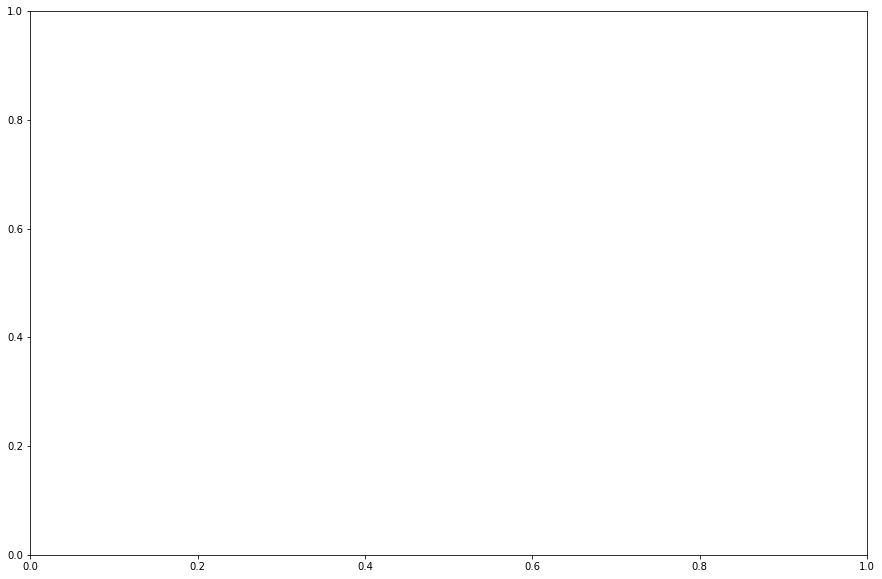

In [35]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.sankey import Sankey

# Prepare data for Sankey
sources = []
targets = []
values = []

days = ["Day 1", "Day 3", "Day 7", "Day 14", "Day 21", "Day 27"]
discharge_statuses = ["Premature Death", "No BPD", "Grade 1 BPD", "Grade 2 BPD", "Grade 3 BPD"]

# Add flows for stay_in_top10 between days
for i in range(5):
    sources.append(days[i])
    targets.append(days[i+1])
    values.append(stay_in_top10_flows[i])

# Add flows for drop_out between days and new entries
for i in range(4):
    sources.append(days[i])
    targets.append(days[i] + " Drop Out")
    values.append(drop_out_flows[i])
    
    sources.append(days[i+1])
    targets.append(days[i] + " New Entries")
    values.append(new_entries_flows[i])

# Add flows for Day 27 to discharge statuses
for status, count in discharge_counts.items():
    sources.append("Day 27")
    targets.append(discharge_statuses[status+1])  # +1 to account for -1 index
    values.append(count)

# Create Sankey plot
fig, ax = plt.subplots(figsize=(15, 10))
sankey = Sankey(ax=ax, scale=0.0005, offset=0.3, head_angle=180, format='%d', unit=None)
for i in range(len(sources)):
    sankey.add(flows=[-values[i], values[i]],
               labels=['', targets[i]],
               orientations=[-1, 0],
               prior=np.where(np.array(sankey.labels) == sources[i])[0][0] if sources[i] in sankey.labels else None,
               connect=(1, 0))

sankey.finish()
plt.title("Patient Flow from Day 1 to Discharge Statuses")
plt.show()

# Correct the approach to build the Sankey plot

# Labels for the Sankey plot
labels = days + [day + " Drop Out" for day in days[:-1]] + [day + " New Entries" for day in days[1:]] + discharge_statuses

# Indices in labels list
label_indices = {label: idx for idx, label in enumerate(labels)}

# Prepare source, target and values in terms of indices
source_indices = [label_indices[src] for src in sources]
target_indices = [label_indices[tgt] for tgt in targets]

# Use plotly to create the Sankey plot
import plotly.graph_objects as go

fig = go.Figure(go.Sankey(
    node=dict(pad=15, thickness=20, line=dict(color="black", width=0.5), label=labels),
    link=dict(source=source_indices, target=target_indices, value=values)
))

fig.update_layout(title_text="Patient Flow from Day 1 to Discharge Statuses", font_size=10)
fig.show()
# Correct the target labels for the new entries flows
for i in range(4):
    targets[i + 10] = days[i+1] + " New Entries"

# Re-prepare the target indices with the corrected target labels
target_indices = [label_indices[tgt] for tgt in targets]

# Use plotly to create the Sankey plot
fig = go.Figure(go.Sankey(
    node=dict(pad=15, thickness=20, line=dict(color="black", width=0.5), label=labels),
    link=dict(source=source_indices, target=target_indices, value=values)
))

fig.update_layout(title_text="Patient Flow from Day 1 to Discharge Statuses", font_size=10)
fig.show()

# Adjust the new entries targets correctly
for i in range(4):
    targets[i + 10] = days[i] + " New Entries"

# Re-prepare the target indices with the corrected target labels
target_indices = [label_indices[tgt] for tgt in targets]

# Use plotly to create the Sankey plot again
fig = go.Figure(go.Sankey(
    node=dict(pad=15, thickness=20, line=dict(color="black", width=0.5), label=labels),
    link=dict(source=source_indices, target=target_indices, value=values)
))

fig.update_layout(title_text="Patient Flow from Day 1 to Discharge Statuses", font_size=10)
fig.show()
# Removing the "Day 1 New Entries" from targets
targets = [tgt for tgt in targets if tgt != "Day 1 New Entries"]

# Re-prepare the target indices without the incorrect label
target_indices = [label_indices[tgt] for tgt in targets]

# Use plotly to create the Sankey plot once more
fig = go.Figure(go.Sankey(
    node=dict(pad=15, thickness=20, line=dict(color="black", width=0.5), label=labels),
    link=dict(source=source_indices, target=target_indices, value=values)
))

fig.update_layout(title_text="Patient Flow from Day 1 to Discharge Statuses", font_size=10)
fig.show()


In [34]:
# Coherent script (updated)

# 1. Identify flows between days

# Lists to store flows
stay_in_top10_flows = []
drop_out_flows = []
new_entries_flows = []

# Dataframes for each day
dfs = [day1_df, day3_df, day7_df, day14_df, day21_df, day27_df]

# Calculate flows
for i in range(len(dfs) - 1):
    # Stay in top 10%
    stay_in_top10 = set(dfs[i]['PatientSeqID']).intersection(set(dfs[i+1]['PatientSeqID']))
    stay_in_top10_flows.append(len(stay_in_top10))
    
    # Drop out of top 10%
    drop_out = set(dfs[i]['PatientSeqID']) - set(dfs[i+1]['PatientSeqID'])
    drop_out_flows.append(len(drop_out))
    
    # New entries to top 10%
    new_entries = set(dfs[i+1]['PatientSeqID']) - set(dfs[i]['PatientSeqID'])
    new_entries_flows.append(len(new_entries))

# 2. Identify flows from Day 27 to discharge statuses
filtered_discharge_df = discharge_df[discharge_df['PatientSeqID'].isin(day27_df['PatientSeqID'])]
discharge_counts = filtered_discharge_df.groupby('BPD Grade').size().to_dict()

# 3. Prepare data for the Sankey plot
labels = days + [day + " Drop Out" for day in days[1:]] + [day + " New Entries" for day in days[1:]] + discharge_statuses
label_indices = {label: idx for idx, label in enumerate(labels)}
sources = []
targets = []
values = []

# Flows between days
for i in range(len(days) - 1):
    sources.extend([days[i], days[i], days[i+1]])
    targets.extend([days[i+1], days[i+1] + " Drop Out", days[i+1] + " New Entries"])
    values.extend([stay_in_top10_flows[i], drop_out_flows[i], new_entries_flows[i]])

# Flows from Day 27 to discharge statuses
for grade, count in discharge_counts.items():
    sources.append("Day 27")
    targets.append(discharge_statuses[grade+1])  # +1 to account for -1 index
    values.append(count)

source_indices = [label_indices[src] for src in sources]
target_indices = [label_indices[tgt] for tgt in targets]

# 4. Generate the Sankey plot
fig = go.Figure(go.Sankey(
    node=dict(pad=15, thickness=20, line=dict(color="black", width=0.5), label=labels),
    link=dict(source=source_indices, target=target_indices, value=values)
))

fig.update_layout(title_text="Patient Flow from Day 1 to Discharge Statuses", font_size=10)
fig.show()


TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [11]:
# Load data
lr_d1g3_df = pd.read_csv(CDATA_DIR_PATH + 'lr_d1g3_tc_df.csv')
lr_d3g3_df = pd.read_csv(CDATA_DIR_PATH + 'lr_d3g3_tc_df.csv')
lr_d7g3_df = pd.read_csv(CDATA_DIR_PATH + 'lr_d7g3_tc_df.csv')
lr_d14g3_df = pd.read_csv(CDATA_DIR_PATH + 'lr_d14g3_tc_df.csv')

In [32]:
not_d1 = set(list(pm_df['PatientSeqID'])) - set(list(lr_d1g3_df['PatientSeqID']))
not_d1_df = pd.DataFrame({"PatientSeqID": list(not_d1), 'umap_KMeans_2': [2 for _ in range(len(not_d1))]})
upd_lr_d1g3_df = pd.concat([lr_d1g3_df, not_d1_df])

In [86]:
nd1 = set(list(lr_d3g3_df['PatientSeqID']) + list(lr_d7g3_df['PatientSeqID']) + list(lr_d14g3_df['PatientSeqID']))
not_in_d1 = nd1 - set(list(lr_d1g3_df))
len(not_in_d1)
not_in_d1_df = pd.DataFrame({"PatientSeqID": list(not_in_d1), 
                             'umap_KMeans_2': [2 for _ in range(len(not_in_d1))]})


new_upd_lr_d1g3_df = pd.concat([lr_d1g3_df, not_in_d1_df])
# We will track the progression of patients using the 'umap_KMeans_2' column as the cluster identity
# Day 1 to Day 3
merged_d1_d3 = pd.merge(new_upd_lr_d1g3_df[['PatientSeqID', 'umap_KMeans_2']], 
                        lr_d3g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d3.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster']

# Renaming the clusters for clarity
merged_d1_d3['Day1_Cluster'] = merged_d1_d3['Day1_Cluster'].map({0:'Bad in Day1', 1:'Good in Day1', 
                                                                 2: 'Not in Day1 DF'})
merged_d1_d3['Day3_Cluster'] = merged_d1_d3['Day3_Cluster'].map({0:'Bad in Day3', 1:'Good in Day3'})

# If the patient is not in the Day 3 dataframe, we assign them to a separate category
merged_d1_d3['Day3_Cluster'].fillna('Not in Day3 DF', inplace=True)

# Day 1 to Day 7
merged_d1_d7 = pd.merge(merged_d1_d3, lr_d7g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d7.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster', 'Day7_Cluster']

# Renaming the clusters for clarity
merged_d1_d7['Day7_Cluster'] = merged_d1_d7['Day7_Cluster'].map({0:'Bad in Day7', 1:'Good in Day7'})

# If the patient is not in the Day 7 dataframe, we assign them to a separate category
merged_d1_d7['Day7_Cluster'].fillna('Not in Day7 DF', inplace=True)

# Day 1 to Day 14
merged_d1_d14 = pd.merge(merged_d1_d7, lr_d14g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d14.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster', 'Day7_Cluster', 'Day14_Cluster']

# Renaming the clusters for clarity
merged_d1_d14['Day14_Cluster'] = merged_d1_d14['Day14_Cluster'].map({1:'Bad in Day14', 0:'Good in Day14'})

# If the patient is not in the Day 14 dataframe, we assign them to a separate category
merged_d1_d14['Day14_Cluster'].fillna('Not in Day14 DF', inplace=True)

# Define the discharge status labels
discharge_status_labels = {
    4: 'Premature Death',
    0: 'No BPD',
    1: 'Grade 1 BPD',
    2: 'Grade 2 BPD',
    3: 'Grade 3 BPD'
}

# Merge the Day 14 dataframe with the discharge status dataframe
merged_d1_d14_dis = pd.merge(merged_d1_d14, dis_df[['PatientSeqID', 'BPD Grade']], on='PatientSeqID', 
                                   how='left')

# Rename the 'BPD Grade' column to 'Discharge_Status'
merged_d1_d14_dis.rename(columns={'BPD Grade': 'Discharge_Status'}, inplace=True)

# Replace the discharge status codes with the corresponding labels
merged_d1_d14_dis['Discharge_Status'] = merged_d1_d14_dis['Discharge_Status'].map(discharge_status_labels)


# Creating Sankey Dataframe

# Day 1 to Day 3
source_d1_d3 = merged_d1_d7['Day1_Cluster']
target_d1_d3 = merged_d1_d7['Day3_Cluster']
df_d1_d3 = pd.DataFrame({'source': source_d1_d3, 'target': target_d1_d3, 'value': 1})

# Day 3 to Day 7
source_d3_d7 = merged_d1_d7['Day3_Cluster']
target_d3_d7 = merged_d1_d7['Day7_Cluster']
df_d3_d7 = pd.DataFrame({'source': source_d3_d7, 'target': target_d3_d7, 'value': 1})

# Append the two dataframes
sankey_df = pd.concat([df_d1_d3, df_d3_d7])

# Sum the flows from each source to each target
sankey_df = sankey_df.groupby(['source', 'target']).sum().reset_index()

# Day 7 to Day 14
source_d7_d14 = merged_d1_d14['Day7_Cluster']
target_d7_d14 = merged_d1_d14['Day14_Cluster']
df_d1_d14 = pd.DataFrame({'source': source_d7_d14, 'target': target_d7_d14, 'value': 1})

# Append to previous two dataframes
sankey_df = pd.concat([sankey_df, df_d1_d14])

# Day 14 to Discharge
source_d14_discharge = merged_d1_d14_dis['Day14_Cluster']
target_d14_discharge = merged_d1_d14_dis['Discharge_Status']
df_d14_discharge = pd.DataFrame({'source': source_d14_discharge, 'target': target_d14_discharge, 'value': 1})

# Append the new dataframe to the existing Sankey dataframe
sankey_df = pd.concat([sankey_df, df_d14_discharge])

# Sum the flows from each source to each target
sankey_df = sankey_df.groupby(['source', 'target']).sum().reset_index()

sankey_df.head()

import plotly.graph_objects as go

#Sort by Source and then Destination
ordered = ['Bad in Day1', 'Good in Day1', 'Not in Day1 DF', 'Bad in Day3', 'Good in Day3', 'Not in Day3 DF',
          'Bad in Day7', 'Good in Day7', 'Not in Day7 DF', 'Bad in Day14', 'Good in Day14', 'Not in Day14 DF',
          'Premature Death', 'Grade 3 BPD', 'Grade 2 BPD', 'Grade 1 BPD', 'No BPD']
sankey_df['source'] = pd.Categorical(sankey_df['source'], ordered)
sankey_df['target'] = pd.Categorical(sankey_df['target'], ordered)
sankey_df.sort_values(['source', 'target'], inplace = True)
sankey_df.reset_index(drop=True)

# Define nodes for the Sankey diagram
label_list = ordered

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Define colors for each category
color_dict = {
    'Bad in Day1': 'lightcoral',
    'Good in Day1': 'yellow',
    'Not in Day1 DF': 'lightgreen',
    'Bad in Day3': 'lightcoral',
    'Good in Day3': 'yellow',
    'Bad in Day7': 'lightcoral',
    'Good in Day7': 'yellow',
    'Bad in Day14': 'lightcoral',
    'Good in Day14': 'yellow',
    'Not in Day3 DF': 'lightgreen',
    'Not in Day7 DF': 'lightgreen',
    'Not in Day14 DF': 'lightgreen',
    'Premature Death': 'maroon',
    'No BPD': 'limegreen',
    'Grade 1 BPD': 'yellow',
    'Grade 2 BPD': 'lightcoral',
    'Grade 3 BPD': 'red'
}

# Map the colors to the labels
color_list = [color_dict[label] for label in label_list]

# Map the colors to the links (using the color of the source node for each link)
link_colors = [color_dict[source] for source in sankey_df['source']]

# X, Y Positions
node_x = [0.001, 0.001, 0.001, 0.25, 0.25, 0.25, 0.5, 0.5, 0.5, 0.75, 0.75, 0.75, 0.999, 0.999, 0.999]
node_y = [0.001, 1063/4246, 591/4246, 2592/4246, 0.001, 1950/4246, 856/4246, 1440/4246, 
             0.001, 1980/4246, 731/4246, 1540/4246, 0.001, 1550/4246, 1200/4246, 1490/4246, 
            0.001, 246/4246, 270/4246, 1580/4246, 1180/4246, 976/4246],

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    arrangement='snap',
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list,
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=link_colors  # Add colors to links
    )
)])

fig.update_layout(title_text="Patient Progression", font_size=10)
fig.show()


In [83]:
sankey_df.loc[sankey_df['source']=='Not in Day3 DF']

,source,target,value
35,Not in Day3 DF,Bad in Day7,383
36,Not in Day3 DF,Good in Day7,178
37,Not in Day3 DF,Not in Day7 DF,882


In [84]:
1592+126+227+427+429+383+178+882

4244

In [48]:
# We will track the progression of patients using the 'umap_KMeans_2' column as the cluster identity
# Day 1 to Day 3
merged_d1_d3 = pd.merge(upd_lr_d1g3_df[['PatientSeqID', 'umap_KMeans_2']], 
                        lr_d3g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d3.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster']

# Renaming the clusters for clarity
merged_d1_d3['Day1_Cluster'] = merged_d1_d3['Day1_Cluster'].map({0:'Bad in Day1', 1:'Good in Day1', 
                                                                 2: 'Not in Day1 DF'})
merged_d1_d3['Day3_Cluster'] = merged_d1_d3['Day3_Cluster'].map({0:'Bad in Day3', 1:'Good in Day3'})

# If the patient is not in the Day 3 dataframe, we assign them to a separate category
merged_d1_d3['Day3_Cluster'].fillna('Not in Day3 DF', inplace=True)

merged_d1_d3

,PatientSeqID,Day1_Cluster,Day3_Cluster
0,5231421,Good in Day1,Good in Day3
1,5232015,Bad in Day1,Bad in Day3
2,5232702,Bad in Day1,Bad in Day3
3,5233761,Bad in Day1,Not in Day3 DF
4,5234595,Good in Day1,Good in Day3
...,...,...,...
61900,6029303,Not in Day1 DF,Not in Day3 DF
61901,5636090,Not in Day1 DF,Not in Day3 DF
61902,5898235,Not in Day1 DF,Not in Day3 DF
61903,6160380,Not in Day1 DF,Not in Day3 DF


In [49]:
# Day 1 to Day 7
merged_d1_d7 = pd.merge(merged_d1_d3, lr_d7g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d7.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster', 'Day7_Cluster']

# Renaming the clusters for clarity
merged_d1_d7['Day7_Cluster'] = merged_d1_d7['Day7_Cluster'].map({0:'Bad in Day7', 1:'Good in Day7'})

# If the patient is not in the Day 7 dataframe, we assign them to a separate category
merged_d1_d7['Day7_Cluster'].fillna('Not in Day7 DF', inplace=True)

merged_d1_d7.head()

,PatientSeqID,Day1_Cluster,Day3_Cluster,Day7_Cluster
0,5231421,Good in Day1,Good in Day3,Not in Day7 DF
1,5232015,Bad in Day1,Bad in Day3,Bad in Day7
2,5232702,Bad in Day1,Bad in Day3,Bad in Day7
3,5233761,Bad in Day1,Not in Day3 DF,Not in Day7 DF
4,5234595,Good in Day1,Good in Day3,Not in Day7 DF


In [50]:
# Day 1 to Day 14
merged_d1_d14 = pd.merge(merged_d1_d7, lr_d14g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d14.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster', 'Day7_Cluster', 'Day14_Cluster']

# Renaming the clusters for clarity
merged_d1_d14['Day14_Cluster'] = merged_d1_d14['Day14_Cluster'].map({1:'Bad in Day14', 0:'Good in Day14'})

# If the patient is not in the Day 14 dataframe, we assign them to a separate category
merged_d1_d14['Day14_Cluster'].fillna('Not in Day14 DF', inplace=True)

merged_d1_d14.head()

,PatientSeqID,Day1_Cluster,Day3_Cluster,Day7_Cluster,Day14_Cluster
0,5231421,Good in Day1,Good in Day3,Not in Day7 DF,Not in Day14 DF
1,5232015,Bad in Day1,Bad in Day3,Bad in Day7,Bad in Day14
2,5232702,Bad in Day1,Bad in Day3,Bad in Day7,Good in Day14
3,5233761,Bad in Day1,Not in Day3 DF,Not in Day7 DF,Not in Day14 DF
4,5234595,Good in Day1,Good in Day3,Not in Day7 DF,Not in Day14 DF


In [51]:
# Define the discharge status labels
discharge_status_labels = {
    4: 'Premature Death',
    0: 'No BPD',
    1: 'Grade 1 BPD',
    2: 'Grade 2 BPD',
    3: 'Grade 3 BPD'
}

# Merge the Day 14 dataframe with the discharge status dataframe
merged_d1_d14_dis = pd.merge(merged_d1_d14, dis_df[['PatientSeqID', 'BPD Grade']], on='PatientSeqID', 
                                   how='left')

# Rename the 'BPD Grade' column to 'Discharge_Status'
merged_d1_d14_dis.rename(columns={'BPD Grade': 'Discharge_Status'}, inplace=True)

# Replace the discharge status codes with the corresponding labels
merged_d1_d14_dis['Discharge_Status'] = merged_d1_d14_dis['Discharge_Status'].map(discharge_status_labels)

merged_d1_d14_dis.head()


,PatientSeqID,Day1_Cluster,Day3_Cluster,Day7_Cluster,Day14_Cluster,Discharge_Status
0,5231421,Good in Day1,Good in Day3,Not in Day7 DF,Not in Day14 DF,Grade 3 BPD
1,5232015,Bad in Day1,Bad in Day3,Bad in Day7,Bad in Day14,Premature Death
2,5232702,Bad in Day1,Bad in Day3,Bad in Day7,Good in Day14,Grade 2 BPD
3,5233761,Bad in Day1,Not in Day3 DF,Not in Day7 DF,Not in Day14 DF,Grade 2 BPD
4,5234595,Good in Day1,Good in Day3,Not in Day7 DF,Not in Day14 DF,Grade 1 BPD


In [52]:
# Creating Sankey Dataframe

# Day 1 to Day 3
source_d1_d3 = merged_d1_d7['Day1_Cluster']
target_d1_d3 = merged_d1_d7['Day3_Cluster']
df_d1_d3 = pd.DataFrame({'source': source_d1_d3, 'target': target_d1_d3, 'value': 1})

# Day 3 to Day 7
source_d3_d7 = merged_d1_d7['Day3_Cluster']
target_d3_d7 = merged_d1_d7['Day7_Cluster']
df_d3_d7 = pd.DataFrame({'source': source_d3_d7, 'target': target_d3_d7, 'value': 1})

# Append the two dataframes
sankey_df = pd.concat([df_d1_d3, df_d3_d7])

# Sum the flows from each source to each target
sankey_df = sankey_df.groupby(['source', 'target']).sum().reset_index()

# Day 7 to Day 14
source_d7_d14 = merged_d1_d14['Day7_Cluster']
target_d7_d14 = merged_d1_d14['Day14_Cluster']
df_d1_d14 = pd.DataFrame({'source': source_d7_d14, 'target': target_d7_d14, 'value': 1})

# Append to previous two dataframes
sankey_df = pd.concat([sankey_df, df_d1_d14])

# Day 14 to Discharge
source_d14_discharge = merged_d1_d14_dis['Day14_Cluster']
target_d14_discharge = merged_d1_d14_dis['Discharge_Status']
df_d14_discharge = pd.DataFrame({'source': source_d14_discharge, 'target': target_d14_discharge, 'value': 1})

# Append the new dataframe to the existing Sankey dataframe
sankey_df = pd.concat([sankey_df, df_d14_discharge])

# Sum the flows from each source to each target
sankey_df = sankey_df.groupby(['source', 'target']).sum().reset_index()

sankey_df.head()


,source,target,value
0,Bad in Day1,Bad in Day3,774
1,Bad in Day1,Good in Day3,16
2,Bad in Day1,Not in Day3 DF,271
3,Bad in Day14,Grade 1 BPD,265
4,Bad in Day14,Grade 2 BPD,496


In [57]:
import plotly.graph_objects as go

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Define colors for each category
color_dict = {
    'Bad in Day1': 'lightcoral',
    'Good in Day1': 'yellow',
    'Not in Day1 DF': 'lightgreen',
    'Bad in Day3': 'lightcoral',
    'Good in Day3': 'yellow',
    'Bad in Day7': 'lightcoral',
    'Good in Day7': 'yellow',
    'Bad in Day14': 'lightcoral',
    'Good in Day14': 'yellow',
    'Not in Day3 DF': 'lightgreen',
    'Not in Day7 DF': 'lightgreen',
    'Not in Day14 DF': 'lightgreen',
    'Premature Death': 'maroon',
    'No BPD': 'limegreen',
    'Grade 1 BPD': 'yellow',
    'Grade 2 BPD': 'lightcoral',
    'Grade 3 BPD': 'red'
}

# Map the colors to the labels
color_list = [color_dict[label] for label in label_list]

# Map the colors to the links (using the color of the source node for each link)
link_colors = [color_dict[source] for source in sankey_df['source']]

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=link_colors  # Add colors to links
    )
)])

fig.update_layout(title_text="Patient Progression", font_size=10)
fig.show()


## trying something else

In [ ]:
not_in_d1 = 

In [50]:
import plotly.graph_objects as go

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Define colors for each category
color_dict = {
    'Bad in Day1': 'lightcoral',
    'Good in Day1': 'yellow',
    'Bad in Day3': 'lightcoral',
    'Good in Day3': 'yellow',
    'Bad in Day7': 'lightcoral',
    'Good in Day7': 'yellow',
    'Not in Day3 DF': 'lightgreen',
    'Not in Day7 DF': 'lightgreen'
}

# Map the colors to the labels
color_list = [color_dict[label] for label in label_list]

# Map the colors to the links (using the color of the source node for each link)
link_colors = [color_dict[source] for source in sankey_df['source']]

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=link_colors  # Add colors to links
    )
)])

fig.update_layout(title_text="Patient Progression from Day 1 Risk Clusters", font_size=10)
fig.show()


In [55]:
# I wanted to then add in what happens if we also look at final outcomes
# Define the discharge status labels
discharge_status_labels = {
    4: 'Premature Death',
    0: 'No BPD',
    1: 'Grade 1 BPD',
    2: 'Grade 2 BPD',
    3: 'Grade 3 BPD'
}

# Merge the Day 7 dataframe with the discharge status dataframe
merged_d1_d7_discharge = pd.merge(merged_d1_d7, dis_df[['PatientSeqID', 'BPD Grade']], on='PatientSeqID', how='left')

# Rename the 'BPD Grade' column to 'Discharge_Status'
merged_d1_d7_discharge.rename(columns={'BPD Grade': 'Discharge_Status'}, inplace=True)

# Replace the discharge status codes with the corresponding labels
merged_d1_d7_discharge['Discharge_Status'] = merged_d1_d7_discharge['Discharge_Status'].map(discharge_status_labels)

merged_d1_d7_discharge.head()

,PatientSeqID,Day1_Cluster,Day3_Cluster,Day7_Cluster,Discharge_Status
0,5231421,Good in Day1,Good in Day3,Not in Day7 DF,Grade 3 BPD
1,5232015,Bad in Day1,Bad in Day3,Bad in Day7,Premature Death
2,5232702,Bad in Day1,Bad in Day3,Bad in Day7,Grade 2 BPD
3,5233761,Bad in Day1,Not in Day3 DF,Not in Day7 DF,Grade 2 BPD
4,5234595,Good in Day1,Good in Day3,Not in Day7 DF,Grade 1 BPD


In [56]:
# Day 7 to Discharge
source_d7_discharge = merged_d1_d7_discharge['Day7_Cluster']
target_d7_discharge = merged_d1_d7_discharge['Discharge_Status']
df_d7_discharge = pd.DataFrame({'source': source_d7_discharge, 'target': target_d7_discharge, 'value': 1})

# Append the new dataframe to the existing Sankey dataframe
sankey_df = pd.concat([sankey_df, df_d7_discharge])

# Sum the flows from each source to each target
sankey_df = sankey_df.groupby(['source', 'target']).sum().reset_index()

sankey_df.head()


,source,target,value
0,Bad in Day1,Bad in Day3,774
1,Bad in Day1,Good in Day3,16
2,Bad in Day1,Not in Day3 DF,271
3,Bad in Day3,Bad in Day7,655
4,Bad in Day3,Good in Day7,46


In [59]:
import plotly.graph_objects as go

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))

# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Define colors for each category
color_dict = {
    'Bad in Day1': 'lightcoral',
    'Good in Day1': 'yellow',
    'Bad in Day3': 'lightcoral',
    'Good in Day3': 'yellow',
    'Bad in Day7': 'lightcoral',
    'Good in Day7': 'yellow',
    'Not in Day3 DF': 'lightgreen',
    'Not in Day7 DF': 'lightgreen',
    'Premature Death': 'maroon',
    'No BPD': 'limegreen',
    'Grade 1 BPD': 'yellow',
    'Grade 2 BPD': 'lightcoral',
    'Grade 3 BPD': 'red'
}

# Map the colors to the labels
color_list = [color_dict[label] for label in label_list]

# Map the colors to the links (using the color of the source node for each link)
link_colors = [color_dict[source] for source in sankey_df['source']]

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=link_colors  # Add colors to links
    )
)])

fig.update_layout(title_text="Patient Progression from Day 1 Risk Clusters", font_size=10)
fig.show()


In [ ]:
# Day 1 to Day 14
merged_d1_d14 = pd.merge(merged_d1_d7, lr_d14g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d1_d14.columns = ['PatientSeqID', 'Day1_Cluster', 'Day3_Cluster', 'Day7_Cluster', 'Day14_Cluster']

# Renaming the clusters for clarity
merged_d1_d14['Day14_Cluster'] = merged_d1_d14['Day14_Cluster'].map({1:'Bad in Day14', 0:'Good in Day14'})

# If the patient is not in the Day 14 dataframe, we assign them to a separate category
merged_d1_d14['Day14_Cluster'].fillna('Not in Day14 DF', inplace=True)

# Define the discharge status labels
discharge_status_labels = {
    4: 'Premature Death',
    0: 'No BPD',
    1: 'Grade 1 BPD',
    2: 'Grade 2 BPD',
    3: 'Grade 3 BPD'
}

# Merge the Day 14 dataframe with the discharge status dataframe
merged_d1_d14_dis = pd.merge(merged_d1_d14, dis_df[['PatientSeqID', 'BPD Grade']], on='PatientSeqID', 
                                   how='left')

# Rename the 'BPD Grade' column to 'Discharge_Status'
merged_d1_d14_dis.rename(columns={'BPD Grade': 'Discharge_Status'}, inplace=True)

# Replace the discharge status codes with the corresponding labels
merged_d1_d14_dis['Discharge_Status'] = merged_d1_d14_dis['Discharge_Status'].map(discharge_status_labels)


In [70]:
# Start from Day 3 to Day 7
merged_d3_d7 = pd.merge(lr_d3g3_df[['PatientSeqID', 'umap_KMeans_2']], lr_d7g3_df[['PatientSeqID', 'umap_KMeans_2']], on='PatientSeqID', how='left')
merged_d3_d7.columns = ['PatientSeqID', 'Day3_Cluster', 'Day7_Cluster']

# Renaming the clusters for clarity
merged_d3_d7['Day3_Cluster'] = merged_d3_d7['Day3_Cluster'].map({0:'Bad in Day3', 1:'Good in Day3'})
merged_d3_d7['Day7_Cluster'] = merged_d3_d7['Day7_Cluster'].map({0:'Bad in Day7', 1:'Good in Day7'})

# If the patient is not in the Day 7 dataframe, we assign them to a separate category
merged_d3_d7['Day7_Cluster'].fillna('Not in Day7 DF', inplace=True)

# Merge the Day 7 dataframe with the discharge status dataframe
merged_d3_d7_discharge = pd.merge(merged_d3_d7, dis_df[['PatientSeqID', 'BPD Grade']], on='PatientSeqID', how='left')

# Rename the 'BPD Grade' column to 'Discharge_Status'
merged_d3_d7_discharge.rename(columns={'BPD Grade': 'Discharge_Status'}, inplace=True)

# Replace the discharge status codes with the corresponding labels
merged_d3_d7_discharge['Discharge_Status'] = merged_d3_d7_discharge['Discharge_Status'].map(discharge_status_labels)

# Day 3 to Day 7
source_d3_d7 = merged_d3_d7_discharge['Day3_Cluster']
target_d3_d7 = merged_d3_d7_discharge['Day7_Cluster']
df_d3_d7 = pd.DataFrame({'source': source_d3_d7, 'target': target_d3_d7, 'value': 1})

# Day 7 to Discharge
source_d7_discharge = merged_d3_d7_discharge['Day7_Cluster']
target_d7_discharge = merged_d3_d7_discharge['Discharge_Status']
df_d7_discharge = pd.DataFrame({'source': source_d7_discharge, 'target': target_d7_discharge, 'value': 1})

# Append the two dataframes
sankey_df = pd.concat([df_d3_d7, df_d7_discharge])

# Sum the flows from each source to each target
sankey_df = sankey_df.groupby(['source', 'target']).sum().reset_index()

sankey_df.head()


,source,target,value
0,Bad in Day3,Bad in Day7,937
1,Bad in Day3,Good in Day7,80
2,Bad in Day3,Not in Day7 DF,142
3,Bad in Day7,Grade 1 BPD,267
4,Bad in Day7,Grade 2 BPD,436


In [71]:
sankey_df

,source,target,value
0,Bad in Day3,Bad in Day7,937
1,Bad in Day3,Good in Day7,80
2,Bad in Day3,Not in Day7 DF,142
3,Bad in Day7,Grade 1 BPD,267
4,Bad in Day7,Grade 2 BPD,436
5,Bad in Day7,Grade 3 BPD,87
6,Bad in Day7,No BPD,79
7,Bad in Day7,Premature Death,68
8,Good in Day3,Good in Day7,275
9,Good in Day3,Not in Day7 DF,280


In [67]:
import plotly.graph_objects as go

# Define nodes for the Sankey diagram
label_list = list(set(sankey_df['source']).union(set(sankey_df['target'])))


# Define sources, targets, and values for the Sankey diagram
source_indices = [label_list.index(source) for source in sankey_df['source']]
target_indices = [label_list.index(target) for target in sankey_df['target']]
values = sankey_df['value']

# Define colors for each category
color_dict = {
    'Bad in Day3': 'lightcoral',
    'Good in Day3': 'yellow',
    'Bad in Day7': 'lightcoral',
    'Good in Day7': 'yellow',
    'Not in Day3 DF': 'lightgreen',
    'Not in Day7 DF': 'lightgreen',
    'Premature Death': 'maroon',
    'No BPD': 'limegreen',
    'Grade 1 BPD': 'yellow',
    'Grade 2 BPD': 'lightcoral',
    'Grade 3 BPD': 'red'
}

# Map the colors to the labels
color_list = [color_dict[label] for label in label_list]

# Map the colors to the links (using the color of the source node for each link)
link_colors = [color_dict[source] for source in sankey_df['source']]

# Create the Sankey diagram figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=label_list,
        color=color_list
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=link_colors  # Add colors to links
    )
)])

fig.update_layout(title_text="Patient Progression from Day 3 Risk Clusters", font_size=10)
fig.show()


#### Patient Velocity

In [74]:
external_embeddings = pd.read_csv(DATA_DIR_PATH + 'predictions/external_embeddings_umap.csv')
internal_embeddings = pd.read_csv(DATA_DIR_PATH + 'predictions/internal_embeddings_umap.csv')

# Merge (concatenate) the two dataframes vertically
merged_df = pd.concat([external_embeddings, internal_embeddings], ignore_index=True)

# Display the first few rows of the merged dataframe
merged_df.head()


,Patient,Day,Label,D1,D2
0,5636100,0,0,1.530341,-0.075982
1,5636100,1,0,2.434154,9.075738
2,5636100,2,0,2.523047,9.617430
3,5636100,3,0,2.377377,9.528577
4,5636100,4,0,2.145677,9.341113


In [76]:
timepoints = [1, 3, 7, 14, 21, 27]
# Filter the merged dataframe for the specified timepoints
filtered_data = {day: merged_df[merged_df['Day'] == day] for day in timepoints}

# Display the shape of the filtered data for each timepoint
filtered_data_shapes = {day: data.shape for day, data in filtered_data.items()}
filtered_data_shapes


{1: (21901, 5),
 3: (21358, 5),
 7: (21029, 5),
 14: (20616, 5),
 21: (20395, 5),
 27: (20132, 5)}

<ipython-input-77-a80a808f4055>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-77-a80a808f4055>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-77-a80a808f4055>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-77-a80a

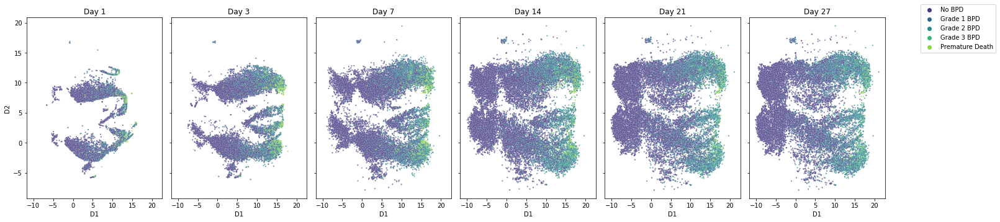

In [77]:
# Define the label mapping
label_mapping = {
    0: "No BPD", 
    1: "Grade 1 BPD", 
    2: "Grade 1 BPD", 
    3: "Grade 2 BPD", 
    4: "Grade 2 BPD", 
    5: "Grade 2 BPD", 
    6: "Grade 3 BPD", 
    7: "Grade 3 BPD", 
    8: "Premature Death"
}

hue_order = ['No BPD', 'Grade 1 BPD', 'Grade 2 BPD', 'Grade 3 BPD', 'Premature Death']

# Apply the label mapping to the filtered data
for day, data in filtered_data.items():
    data['Label'] = data['Label'].map(label_mapping)

# Plot the UMAP embeddings for each timepoint
fig, axes = plt.subplots(1, len(timepoints), figsize=(20, 5), sharex=True, sharey=True)

for ax, (day, data) in zip(axes, filtered_data.items()):
    sns.scatterplot(data=data, x='D1', y='D2', hue='Label', palette='viridis', ax=ax, s=5, alpha=0.7, 
                    hue_order=hue_order)
    ax.set_title(f"Day {day}")
    ax.legend().set_visible(False)

# Set a common legend for all subplots
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.12, 1))

plt.tight_layout()
plt.show()
